https://docs.pytorch.org/tutorials/beginner/transfer_learning_tutorial.html

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchvision
from torchvision import models, transforms
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import os
import glob
import time
import copy

### Load Datasets

In [2]:
train_path = '../ImageNetSketch_Subset/train'
val_path = '../ImageNetSketch_Subset/val'
test_path = '../ImageNetSketch_Subset/test'
saved_models_path = '../models'

In [3]:
batch_size = 32
num_workers = 0

In [4]:
train_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.0)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
train_dataset = torchvision.datasets.ImageFolder(root=train_path, transform = train_transform)
train_dataloader = DataLoader(dataset = train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

In [5]:
val_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
val_dataset = torchvision.datasets.ImageFolder(root=val_path, transform=val_transform)
val_dataloader = DataLoader(dataset = val_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

In [6]:
test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_dataset = torchvision.datasets.ImageFolder(root=test_path, transform=test_transform)
test_dataloader = DataLoader(dataset = test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

In [7]:
train_dataset_size = len(train_dataset)
print(f"Train dataset size: {train_dataset_size}")
val_dataset_size = len(val_dataset)
print(f"Validation dataset size: {val_dataset_size}")
test_dataset_size = len(test_dataset)
print(f"Test dataset size: {test_dataset_size}")

Train dataset size: 3465
Validation dataset size: 495
Test dataset size: 1082


In [8]:
dataloaders = {
    'train': train_dataloader,
    'val': val_dataloader
}
class_names = train_dataset.classes

In [9]:
train_dataset.class_to_idx == val_dataset.class_to_idx

True

In [10]:
train_dataset.class_to_idx == test_dataset.class_to_idx

True

In [11]:
data_iter = iter(train_dataloader)
images, labels = next(data_iter)

print(f"Batch shape: {images.shape}")
print(f"Labels: {labels}")

Batch shape: torch.Size([32, 3, 224, 224])
Labels: tensor([51, 28, 63, 42, 59, 97, 19, 13, 32, 28, 64, 67, 65, 15, 62, 58, 74, 54,
        91, 15, 17, 82,  8, 17, 48, 48, 97, 54, 27, 40, 49, 71])


### Load Model

In [12]:
resnet18_qa = models.resnet18(weights = models.ResNet18_Weights.IMAGENET1K_V1)

In [13]:
n_ip_features_final_layer = resnet18_qa.fc.in_features
print(f"No. of input features in the final layer: {n_ip_features_final_layer}")
print(f"No. of output features in the final layer: {resnet18_qa.fc.out_features}")

No. of input features in the final layer: 512
No. of output features in the final layer: 1000


In [14]:
n_sketch_classes = 99
resnet18_qa.fc = nn.Linear(n_ip_features_final_layer, n_sketch_classes)
print(f"No. of input features in the final layer of modified model: {resnet18_qa.fc.in_features}")
print(f"No. of output features in the final layer of modified model: {resnet18_qa.fc.out_features}")

No. of input features in the final layer of modified model: 512
No. of output features in the final layer of modified model: 99


In [15]:
if torch.backends.mps.is_available():
    device = torch.device('mps')
elif torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

print(f"Using device: {device}")

Using device: mps


In [16]:
# resnet18_qa.to(device)

In [17]:
# Train:
def train_model(model, criterion, optimizer, best_model_params_path = '', num_epochs=15):
  since = time.time()

  # torch.save(model.state_dict(), best_model_params_path)
  best_val_acc = 0.0
  best_train_acc = 0.0
  best_model_weights = copy.deepcopy(model.state_dict())
  train_loss = []
  val_loss = []
  train_acc = []
  val_acc = []


  for epoch in range(num_epochs):
    # for each epoch
    print('=' *30)
    print(f'Epoch {epoch}/{num_epochs - 1}')
    for phase in ['train', 'val']:
      running_loss = 0.0
      running_corrects = 0

      if phase == 'train':
        model.train()
        for inputs, labels in dataloaders[phase]:
          # for each batch
          inputs = inputs.to(device)
          labels = labels.to(device)

          optimizer.zero_grad()

          with torch.set_grad_enabled(True):
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

          running_loss += loss.item() * inputs.size(0)
          running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / train_dataset_size
        epoch_acc = running_corrects.float() / train_dataset_size
        train_loss.append(epoch_loss)
        train_acc.append(epoch_acc)

        if epoch_acc > best_train_acc:
          best_train_acc = epoch_acc

        # scheduler.step()

      else:
        model.eval()
        for inputs, labels in dataloaders[phase]:
          # for each batch
          inputs = inputs.to(device)
          labels = labels.to(device)

          with torch.set_grad_enabled(False):
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

          running_loss += loss.item() * inputs.size(0)
          running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / val_dataset_size
        epoch_acc = running_corrects.float() / val_dataset_size
        val_loss.append(epoch_loss)
        val_acc.append(epoch_acc)

        if epoch_acc > best_val_acc:
          best_val_acc = epoch_acc
          # save the model
          best_model_weights = copy.deepcopy(model.state_dict())

      print(f"{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc * 100:.2f}%")

  print('=' *30)
  time_elapsed = time.time() - since
  print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
  print(f'Best train Acc: {best_train_acc * 100:.2f}%')
  print(f'Best val Acc: {best_val_acc * 100:.2f}%')

  # Load best models weights
  model.load_state_dict(best_model_weights)
#   torch.save(model.state_dict(), best_model_params_path)
  return (model, train_loss, val_loss, train_acc, val_acc)

In [18]:
def test_model(model, dataloader, dataset_size):
  was_training = model.training
  model.eval()

  with torch.no_grad():
    running_corrects = 0
    for inputs, labels in dataloader:
      inputs = inputs.to(device)
      labels = labels.to(device)
      outputs = model(inputs)
      _, preds = torch.max(outputs, 1)
      running_corrects += torch.sum(preds == labels.data)

  acc = (running_corrects.float() / dataset_size) * 100
  model.train(mode=was_training)
  return acc

In [19]:
def plot_training_history(train_loss, val_loss, train_acc, val_acc):
    # Convert any MPS tensors back to standard Python floats
    train_loss = [t.item() if torch.is_tensor(t) else t for t in train_loss]
    val_loss = [t.item() if torch.is_tensor(t) else t for t in val_loss]
    train_acc = [t.item() * 100  if torch.is_tensor(t) else t for t in train_acc]
    val_acc = [t.item() * 100 if torch.is_tensor(t) else t for t in val_acc]
    
    epochs = range(1, len(train_loss) + 1)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Loss Plot
    ax1.plot(epochs, train_loss, 'b-o', label='Train Loss')
    ax1.plot(epochs, val_loss, 'r-o', label='Val Loss')
    ax1.set_title('Loss History')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Accuracy Plot
    ax2.plot(epochs, train_acc, 'b-o', label='Train Acc')
    ax2.plot(epochs, val_acc, 'r-o', label='Val Acc')
    ax2.set_title('Accuracy History')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy (%)')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

### A. Fine-Tuning

#### i. Fine-tuning the whole model

##### a. training with SGD with momentum

In [58]:
resnet18_qa_1 = copy.deepcopy(resnet18_qa)
resnet18_qa_1.to(device)

criterion1 = nn.CrossEntropyLoss()
optimizer1 = torch.optim.SGD(resnet18_qa_1.parameters(), lr=0.001, momentum=0.9)

In [59]:
print(f'Trainable parameters: {sum(p.numel() for p in resnet18_qa_1.parameters() if p.requires_grad)}')

Trainable parameters: 11227299


In [64]:
resnet18_qa_1, train_loss, val_loss, train_acc, val_acc = train_model(resnet18_qa_1, criterion1, optimizer1, num_epochs=15)

Epoch 0/14
train Loss: 4.3753 Acc: 7.99%
val Loss: 3.7449 Acc: 23.84%
Epoch 1/14
train Loss: 3.2796 Acc: 36.85%
val Loss: 2.7490 Acc: 43.23%
Epoch 2/14
train Loss: 2.4695 Acc: 51.77%
val Loss: 2.1716 Acc: 52.53%
Epoch 3/14
train Loss: 1.9464 Acc: 61.53%
val Loss: 1.7942 Acc: 60.20%
Epoch 4/14
train Loss: 1.6069 Acc: 67.71%
val Loss: 1.5442 Acc: 64.44%
Epoch 5/14
train Loss: 1.3488 Acc: 72.93%
val Loss: 1.3864 Acc: 65.86%
Epoch 6/14
train Loss: 1.1633 Acc: 76.51%
val Loss: 1.2739 Acc: 69.70%
Epoch 7/14
train Loss: 0.9850 Acc: 80.35%
val Loss: 1.1363 Acc: 73.33%
Epoch 8/14
train Loss: 0.8637 Acc: 83.52%
val Loss: 1.0708 Acc: 72.93%
Epoch 9/14
train Loss: 0.7572 Acc: 85.54%
val Loss: 1.0210 Acc: 73.13%
Epoch 10/14
train Loss: 0.6621 Acc: 87.68%
val Loss: 0.9589 Acc: 75.15%
Epoch 11/14
train Loss: 0.5965 Acc: 89.03%
val Loss: 0.9306 Acc: 75.76%
Epoch 12/14
train Loss: 0.5331 Acc: 90.82%
val Loss: 0.8786 Acc: 76.36%
Epoch 13/14
train Loss: 0.4682 Acc: 91.11%
val Loss: 0.8624 Acc: 75.76%
Epo

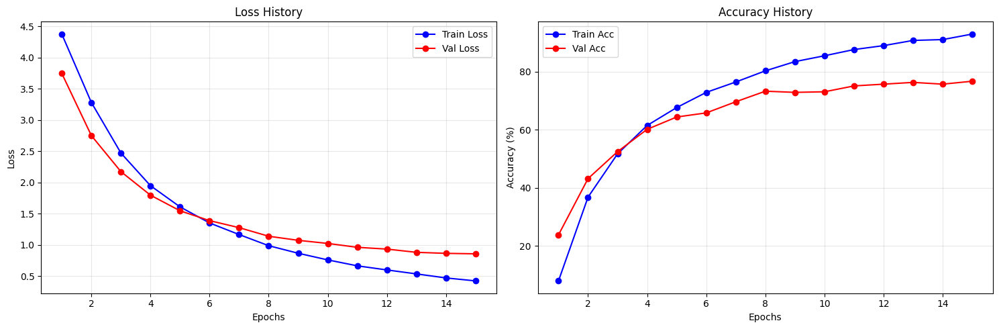

In [76]:
plot_training_history(train_loss, val_loss, train_acc, val_acc)

In [78]:
print('=' *30)
print(f"Model Performance on Test Data:")
test_acc = test_model(resnet18_qa_1, test_dataloader, test_dataset_size)
print(f"Test Accuracy: {test_acc:.2f}%")
print('=' *30)

Model Performance on Test Data:
Test Accuracy: 79.30%


In [ ]:
# TODO: SAVE THE MODEL 

##### b. training with Adam

In [79]:
resnet18_qa_2 = copy.deepcopy(resnet18_qa)
resnet18_qa_2.to(device)

criterion2 = nn.CrossEntropyLoss()
optimizer2 = torch.optim.Adam(resnet18_qa_2.parameters(), lr=0.0001)

In [80]:
print(f'Trainable parameters: {sum(p.numel() for p in resnet18_qa_2.parameters() if p.requires_grad)}')

Trainable parameters: 11227299


In [81]:
resnet18_qa_2, train_loss, val_loss, train_acc, val_acc = train_model(resnet18_qa_2, criterion2, optimizer2, num_epochs=15)

Epoch 0/14
train Loss: 3.7431 Acc: 23.12%
val Loss: 2.5151 Acc: 47.88%
Epoch 1/14
train Loss: 2.1662 Acc: 60.61%
val Loss: 1.8505 Acc: 60.81%
Epoch 2/14
train Loss: 1.4209 Acc: 75.50%
val Loss: 1.4181 Acc: 70.51%
Epoch 3/14
train Loss: 0.9684 Acc: 84.44%
val Loss: 1.1783 Acc: 72.12%
Epoch 4/14
train Loss: 0.6746 Acc: 89.78%
val Loss: 1.0319 Acc: 76.97%
Epoch 5/14
train Loss: 0.4845 Acc: 92.41%
val Loss: 0.9416 Acc: 78.38%
Epoch 6/14
train Loss: 0.3532 Acc: 94.52%
val Loss: 0.9299 Acc: 77.98%
Epoch 7/14
train Loss: 0.2931 Acc: 95.06%
val Loss: 0.8847 Acc: 78.38%
Epoch 8/14
train Loss: 0.2291 Acc: 95.12%
val Loss: 0.8857 Acc: 79.80%
Epoch 9/14
train Loss: 0.2011 Acc: 95.64%
val Loss: 0.8612 Acc: 80.20%
Epoch 10/14
train Loss: 0.1727 Acc: 95.90%
val Loss: 0.8536 Acc: 81.62%
Epoch 11/14
train Loss: 0.1629 Acc: 95.90%
val Loss: 0.8760 Acc: 79.80%
Epoch 12/14
train Loss: 0.1515 Acc: 95.90%
val Loss: 0.8218 Acc: 79.80%
Epoch 13/14
train Loss: 0.1474 Acc: 96.05%
val Loss: 0.8550 Acc: 79.60%
Ep

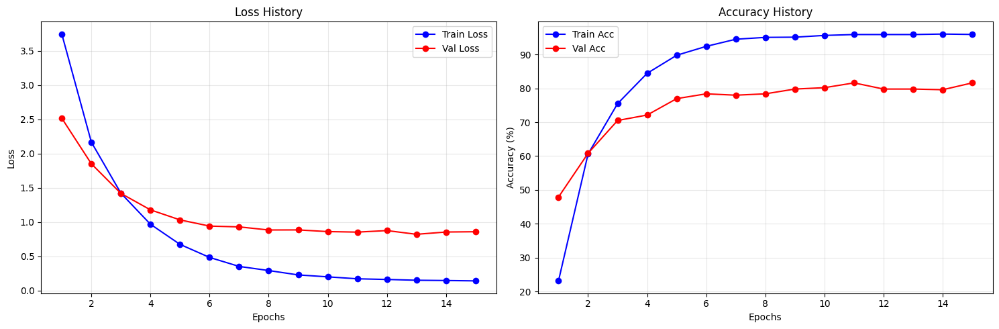

In [82]:
plot_training_history(train_loss, val_loss, train_acc, val_acc)

In [84]:
# WITH LR = 0.0001
print('=' *30)
print(f"Model Performance on Test Data:")
test_acc = test_model(resnet18_qa_2, test_dataloader, test_dataset_size)
print(f"Test Accuracy: {test_acc:.2f}%")
print('=' *30)

Model Performance on Test Data:
Test Accuracy: 82.62%


In [85]:
# Save the model
path = os.path.join(saved_models_path, 'resnet18_qa_complete_ft.pth')
torch.save(resnet18_qa_2.state_dict(), path)

#### ii. Fine-tuning only the last 3 layers

https://medium.com/we-talk-data/guide-to-freezing-layers-in-pytorch-best-practices-and-practical-examples-8e644e7a9598

In [20]:
resnet18_qa_3 = copy.deepcopy(resnet18_qa)

In [21]:
for name, layer in resnet18_qa_3.named_children():
  print(name)

conv1
bn1
relu
maxpool
layer1
layer2
layer3
layer4
avgpool
fc


In [22]:
# freeze all layers before layer 3
for name, layer in resnet18_qa_3.named_children():
  if name in ['conv1', 'bn1','layer1', 'layer2', 'layer3']:
    for param in layer.parameters():
      param.requires_grad = False

In [23]:
for name, param in resnet18_qa_3.named_parameters():
    if param.requires_grad:
        print(f"Trainable Layer: {name}")

Trainable Layer: layer4.0.conv1.weight
Trainable Layer: layer4.0.bn1.weight
Trainable Layer: layer4.0.bn1.bias
Trainable Layer: layer4.0.conv2.weight
Trainable Layer: layer4.0.bn2.weight
Trainable Layer: layer4.0.bn2.bias
Trainable Layer: layer4.0.downsample.0.weight
Trainable Layer: layer4.0.downsample.1.weight
Trainable Layer: layer4.0.downsample.1.bias
Trainable Layer: layer4.1.conv1.weight
Trainable Layer: layer4.1.bn1.weight
Trainable Layer: layer4.1.bn1.bias
Trainable Layer: layer4.1.conv2.weight
Trainable Layer: layer4.1.bn2.weight
Trainable Layer: layer4.1.bn2.bias
Trainable Layer: fc.weight
Trainable Layer: fc.bias


In [24]:
print(f'Trainable parameters: {sum(p.numel() for p in resnet18_qa_3.parameters() if p.requires_grad)}')

Trainable parameters: 8444515


In [26]:
resnet18_qa_3.to(device)

criterion3 = nn.CrossEntropyLoss()
optimizer3 = torch.optim.Adam(filter(lambda param: param.requires_grad, resnet18_qa_3.parameters()), lr=0.0001)

In [27]:
resnet18_qa_3, train_loss, val_loss, train_acc, val_acc = train_model(resnet18_qa_3, criterion3, optimizer3, num_epochs=15)

Epoch 0/14
train Loss: 3.7582 Acc: 22.83%
val Loss: 2.6488 Acc: 47.27%
Epoch 1/14
train Loss: 2.3102 Acc: 57.58%
val Loss: 1.9303 Acc: 61.21%
Epoch 2/14
train Loss: 1.6331 Acc: 71.23%
val Loss: 1.5319 Acc: 68.28%
Epoch 3/14
train Loss: 1.1861 Acc: 80.00%
val Loss: 1.2608 Acc: 71.92%
Epoch 4/14
train Loss: 0.8855 Acc: 86.18%
val Loss: 1.1016 Acc: 75.35%
Epoch 5/14
train Loss: 0.6567 Acc: 90.36%
val Loss: 1.0199 Acc: 76.77%
Epoch 6/14
train Loss: 0.5020 Acc: 92.73%
val Loss: 0.9596 Acc: 76.77%
Epoch 7/14
train Loss: 0.3839 Acc: 94.66%
val Loss: 0.9375 Acc: 81.21%
Epoch 8/14
train Loss: 0.3051 Acc: 95.35%
val Loss: 0.9036 Acc: 80.61%
Epoch 9/14
train Loss: 0.2580 Acc: 95.41%
val Loss: 0.8494 Acc: 80.81%
Epoch 10/14
train Loss: 0.2169 Acc: 95.79%
val Loss: 0.8579 Acc: 81.01%
Epoch 11/14
train Loss: 0.1972 Acc: 95.41%
val Loss: 0.8491 Acc: 81.41%
Epoch 12/14
train Loss: 0.1732 Acc: 95.41%
val Loss: 0.8521 Acc: 80.81%
Epoch 13/14
train Loss: 0.1583 Acc: 96.25%
val Loss: 0.8708 Acc: 82.22%
Ep

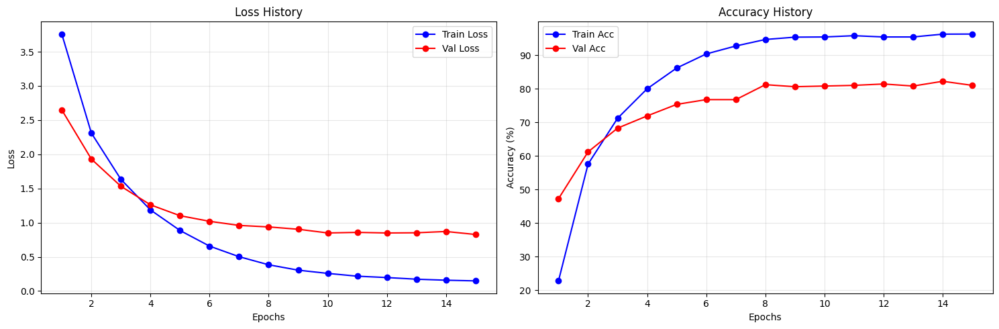

In [28]:
plot_training_history(train_loss, val_loss, train_acc, val_acc)

In [29]:
print('=' *30)
print(f"Model Performance on Test Data:")
test_acc = test_model(resnet18_qa_3, test_dataloader, test_dataset_size)
print(f"Test Accuracy: {test_acc:.2f}%")
print('=' *30)

Model Performance on Test Data:
Test Accuracy: 82.16%


In [96]:
# Save the model
path = os.path.join(saved_models_path, 'resnet18_qa_partial_ft.pth')
torch.save(resnet18_qa_3.state_dict(), path)

### C. Constrained Fine-tuning (Updating only BN layers)

#### i. Performance on constrained fine-tuning

In [97]:
resnet18_qc = copy.deepcopy(resnet18_qa)

In [98]:
for name, layer in resnet18_qc.named_children():
  print(name)

print(f'Trainable parameters: {sum(p.numel() for p in resnet18_qc.parameters() if p.requires_grad)}')

conv1
bn1
relu
maxpool
layer1
layer2
layer3
layer4
avgpool
fc
Trainable parameters: 11227299


In [99]:
for name, param in resnet18_qc.named_parameters():
    if param.requires_grad:
        print(f"Trainable layer: {name}")

Trainable layer: conv1.weight
Trainable layer: bn1.weight
Trainable layer: bn1.bias
Trainable layer: layer1.0.conv1.weight
Trainable layer: layer1.0.bn1.weight
Trainable layer: layer1.0.bn1.bias
Trainable layer: layer1.0.conv2.weight
Trainable layer: layer1.0.bn2.weight
Trainable layer: layer1.0.bn2.bias
Trainable layer: layer1.1.conv1.weight
Trainable layer: layer1.1.bn1.weight
Trainable layer: layer1.1.bn1.bias
Trainable layer: layer1.1.conv2.weight
Trainable layer: layer1.1.bn2.weight
Trainable layer: layer1.1.bn2.bias
Trainable layer: layer2.0.conv1.weight
Trainable layer: layer2.0.bn1.weight
Trainable layer: layer2.0.bn1.bias
Trainable layer: layer2.0.conv2.weight
Trainable layer: layer2.0.bn2.weight
Trainable layer: layer2.0.bn2.bias
Trainable layer: layer2.0.downsample.0.weight
Trainable layer: layer2.0.downsample.1.weight
Trainable layer: layer2.0.downsample.1.bias
Trainable layer: layer2.1.conv1.weight
Trainable layer: layer2.1.bn1.weight
Trainable layer: layer2.1.bn1.bias
Tra

In [ ]:
# freeze all parameters 
for param in resnet18_qc.parameters():
    param.requires_grad = False

# unfreeze BN layers
for name, module in resnet18_qc.named_modules():
    if isinstance(module, nn.BatchNorm2d):
        for param in module.parameters():
            param.requires_grad = True

for name, param in resnet18_qc.named_parameters():
    if param.requires_grad:
        print(f"Trainable layer: {name}")
        
print(f'Trainable parameters: {sum(p.numel() for p in resnet18_qc.parameters() if p.requires_grad)}')

In [106]:
resnet18_qc.to(device)
criterion4 = nn.CrossEntropyLoss()
optimizer4 = torch.optim.Adam(filter(lambda param: param.requires_grad, resnet18_qc.parameters()), lr=0.0001)
# optimizer4 = torch.optim.Adam(resnet18_qc.parameters(), lr=0.0001)

In [107]:
resnet18_qc, train_loss, val_loss, train_acc, val_acc = train_model(resnet18_qc, criterion4, optimizer4, num_epochs=15)

Epoch 0/14
train Loss: 4.8200 Acc: 1.10%
val Loss: 4.8419 Acc: 1.41%
Epoch 1/14
train Loss: 4.7940 Acc: 1.27%
val Loss: 4.8208 Acc: 1.41%
Epoch 2/14
train Loss: 4.7627 Acc: 1.41%
val Loss: 4.7915 Acc: 1.41%
Epoch 3/14
train Loss: 4.7381 Acc: 1.41%
val Loss: 4.7654 Acc: 1.21%
Epoch 4/14
train Loss: 4.7164 Acc: 1.56%
val Loss: 4.7393 Acc: 1.41%
Epoch 5/14
train Loss: 4.6839 Acc: 1.85%
val Loss: 4.7171 Acc: 1.62%
Epoch 6/14
train Loss: 4.6610 Acc: 2.42%
val Loss: 4.6933 Acc: 1.62%
Epoch 7/14
train Loss: 4.6411 Acc: 2.40%
val Loss: 4.6700 Acc: 2.02%
Epoch 8/14
train Loss: 4.6114 Acc: 2.28%
val Loss: 4.6489 Acc: 2.02%
Epoch 9/14
train Loss: 4.5869 Acc: 2.80%
val Loss: 4.6245 Acc: 2.02%
Epoch 10/14
train Loss: 4.5701 Acc: 2.71%
val Loss: 4.6058 Acc: 2.42%
Epoch 11/14
train Loss: 4.5455 Acc: 2.83%
val Loss: 4.5861 Acc: 2.83%
Epoch 12/14
train Loss: 4.5236 Acc: 3.67%
val Loss: 4.5663 Acc: 2.83%
Epoch 13/14
train Loss: 4.5122 Acc: 3.46%
val Loss: 4.5489 Acc: 3.23%
Epoch 14/14
train Loss: 4.4914

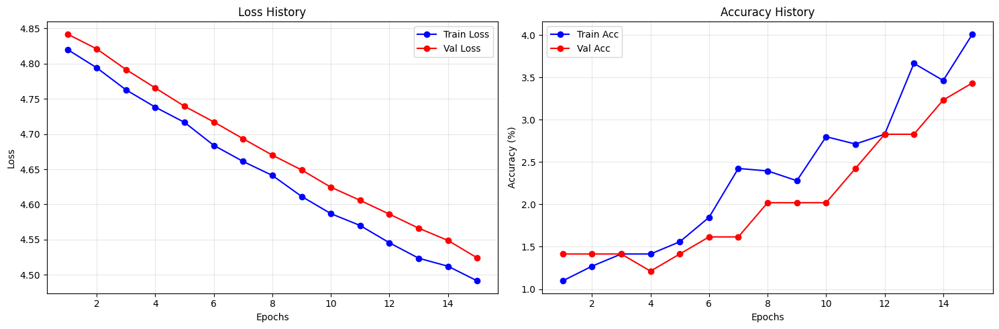

In [108]:
plot_training_history(train_loss, val_loss, train_acc, val_acc)

In [110]:
print('=' *30)
print(f"Model Performance on Test Data:")
test_acc = test_model(resnet18_qc, test_dataloader, test_dataset_size)
print(f"Test Accuracy: {test_acc:.2f}%")
print('=' *30)

Model Performance on Test Data:
Test Accuracy: 4.53%


#### ii. Performance on constrained fine-tuned model (Updating only BN layers and the final FC layer)

In [17]:
resnet18_qc_2 = copy.deepcopy(resnet18_qa)

In [ ]:
# freeze all parameters 
for param in resnet18_qc_2.parameters():
    param.requires_grad = False

# unfreeze BN layers
for name, module in resnet18_qc_2.named_modules():
    if isinstance(module, nn.BatchNorm2d):
        for param in module.parameters():
            param.requires_grad = True

# un-freeze the final FC layer
for param in resnet18_qc_2.fc.parameters():
  param.requires_grad = True

for name, param in resnet18_qc_2.named_parameters():
    if param.requires_grad:
        print(f"Trainable layer: {name}")

print(f'Trainable parameters: {sum(p.numel() for p in resnet18_qc_2.parameters() if p.requires_grad)}')

In [ ]:
resnet18_qc_2.to(device)
criterion5 = nn.CrossEntropyLoss()
optimizer5 = torch.optim.Adam(filter(lambda param: param.requires_grad, resnet18_qc_2.parameters()), lr=0.0001)
resnet18_qc_2, train_loss, val_loss, train_acc, val_acc = train_model(resnet18_qc_2, criterion5, optimizer5, num_epochs=15)

Epoch 0/14
train Loss: 4.6523 Acc: 1.85%
val Loss: 4.4768 Acc: 3.43%
Epoch 1/14
train Loss: 4.3430 Acc: 5.86%
val Loss: 4.2022 Acc: 11.52%
Epoch 2/14
train Loss: 4.0706 Acc: 14.11%
val Loss: 3.9316 Acc: 21.01%
Epoch 3/14
train Loss: 3.8109 Acc: 23.87%
val Loss: 3.6408 Acc: 27.47%
Epoch 4/14
train Loss: 3.5264 Acc: 33.07%
val Loss: 3.3799 Acc: 35.35%
Epoch 5/14
train Loss: 3.2517 Acc: 40.09%
val Loss: 3.1536 Acc: 36.97%
Epoch 6/14
train Loss: 3.0158 Acc: 44.27%
val Loss: 2.9246 Acc: 43.03%
Epoch 7/14
train Loss: 2.7855 Acc: 48.05%
val Loss: 2.6968 Acc: 47.27%
Epoch 8/14
train Loss: 2.6014 Acc: 51.98%
val Loss: 2.5088 Acc: 49.09%
Epoch 9/14
train Loss: 2.4233 Acc: 55.61%
val Loss: 2.3639 Acc: 51.52%
Epoch 10/14
train Loss: 2.2682 Acc: 56.65%
val Loss: 2.2352 Acc: 54.34%
Epoch 11/14
train Loss: 2.1316 Acc: 59.39%
val Loss: 2.1131 Acc: 56.97%
Epoch 12/14
train Loss: 2.0302 Acc: 61.21%
val Loss: 2.0202 Acc: 57.98%
Epoch 13/14
train Loss: 1.9219 Acc: 63.32%
val Loss: 1.9287 Acc: 58.99%
Epoch

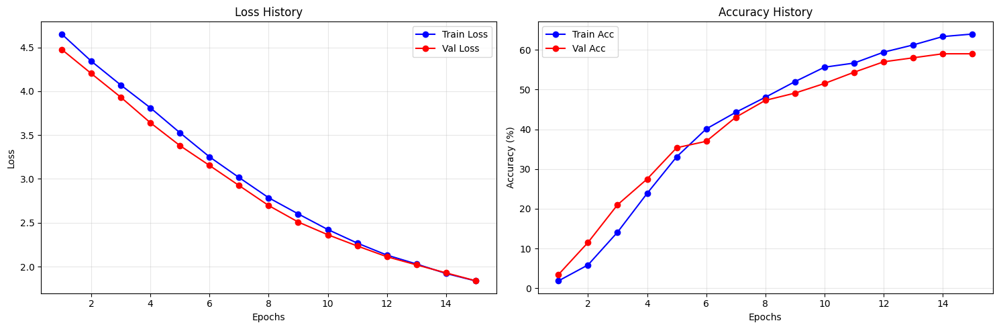

In [117]:
plot_training_history(train_loss, val_loss, train_acc, val_acc)

In [119]:
print('=' *30)
print(f"Model Performance on Test Data:")
test_acc = test_model(resnet18_qc_2, test_dataloader, test_dataset_size)
print(f"Test Accuracy: {test_acc:.2f}%")
print('=' *30)

Model Performance on Test Data:
Test Accuracy: 56.56%


##### With LR: 0.001

In [23]:
resnet18_qc_2b = copy.deepcopy(resnet18_qa)

In [24]:
# freeze all parameters 
for param in resnet18_qc_2b.parameters():
    param.requires_grad = False

# unfreeze BN layers
for name, module in resnet18_qc_2b.named_modules():
    if isinstance(module, nn.BatchNorm2d):
        for param in module.parameters():
            param.requires_grad = True

# un-freeze the final FC layer
for param in resnet18_qc_2b.fc.parameters():
  param.requires_grad = True

print(f'Trainable parameters: {sum(p.numel() for p in resnet18_qc_2b.parameters() if p.requires_grad)}')

Trainable parameters: 60387


In [25]:
resnet18_qc_2b.to(device)
criterion6 = nn.CrossEntropyLoss()
optimizer6 = torch.optim.Adam(filter(lambda param: param.requires_grad, resnet18_qc_2b.parameters()), lr=0.001)
resnet18_qc_2b, train_loss, val_loss, train_acc, val_acc = train_model(resnet18_qc_2b, criterion6, optimizer6, num_epochs=15)

Epoch 0/14
train Loss: 3.8042 Acc: 18.56%
val Loss: 2.5169 Acc: 44.44%
Epoch 1/14
train Loss: 2.0933 Acc: 52.09%
val Loss: 1.6898 Acc: 58.79%
Epoch 2/14
train Loss: 1.5077 Acc: 63.41%
val Loss: 1.3470 Acc: 64.44%
Epoch 3/14
train Loss: 1.2217 Acc: 69.15%
val Loss: 1.2041 Acc: 67.07%
Epoch 4/14
train Loss: 1.0120 Acc: 73.82%
val Loss: 1.0662 Acc: 70.51%
Epoch 5/14
train Loss: 0.8463 Acc: 77.63%
val Loss: 1.0035 Acc: 70.91%
Epoch 6/14
train Loss: 0.7594 Acc: 79.88%
val Loss: 0.9677 Acc: 71.52%
Epoch 7/14
train Loss: 0.6630 Acc: 81.88%
val Loss: 0.8967 Acc: 73.94%
Epoch 8/14
train Loss: 0.6192 Acc: 83.41%
val Loss: 0.8940 Acc: 74.55%
Epoch 9/14
train Loss: 0.5744 Acc: 83.98%
val Loss: 0.8603 Acc: 75.96%
Epoch 10/14
train Loss: 0.5078 Acc: 86.46%
val Loss: 0.8435 Acc: 74.95%
Epoch 11/14
train Loss: 0.4863 Acc: 86.38%
val Loss: 0.8586 Acc: 74.95%
Epoch 12/14
train Loss: 0.4402 Acc: 87.27%
val Loss: 0.8660 Acc: 75.15%
Epoch 13/14
train Loss: 0.4448 Acc: 87.27%
val Loss: 0.8489 Acc: 75.76%
Ep

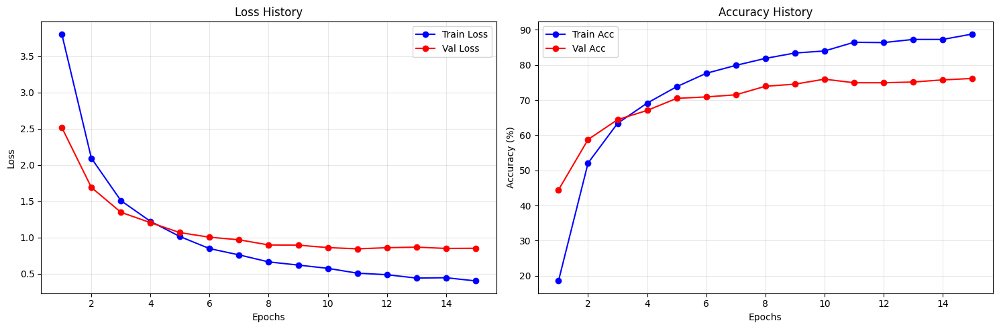

In [26]:
plot_training_history(train_loss, val_loss, train_acc, val_acc)

In [27]:
print('=' *30)
print(f"Model Performance on Test Data:")
test_acc = test_model(resnet18_qc_2b, test_dataloader, test_dataset_size)
print(f"Test Accuracy: {test_acc:.2f}%")
print('=' *30)

Model Performance on Test Data:
Test Accuracy: 78.00%


In [28]:
# Save the model
path = os.path.join(saved_models_path, 'resnet18_qc_constrained_ft.pth')
torch.save(resnet18_qc_2b.state_dict(), path)

#### iii. Performance with all layers frozen

In [94]:
resnet18_qc_3 = copy.deepcopy(resnet18_qa)

In [95]:
# freeze all parameters 
for param in resnet18_qc_3.parameters():
    param.requires_grad = False

In [96]:
for name, param in resnet18_qc_3.named_parameters():
    if param.requires_grad:
        print(f"Trainable layer: {name}")

In [97]:
print(f'Trainable parameters: {sum(p.numel() for p in resnet18_qc_3.parameters() if p.requires_grad)}')

Trainable parameters: 0


In [99]:
resnet18_qc_3.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [100]:
print('=' *30)
print(f"Model Performance on Test Data:")
test_acc = test_model(resnet18_qc_3, test_dataloader, test_dataset_size)
print(f"Test Accuracy: {test_acc:.2f}%")
print('=' *30)

Model Performance on Test Data:
Test Accuracy: 0.37%


### B. Visualizing features

In [29]:
from torchvision.transforms import v2 as T
from torch import Tensor, nn
from torchvision.io import decode_image
from typing import Literal
import math
from IPython.display import Markdown
from collections.abc import Callable

In [30]:
IMAGENET1K_MEAN = [0.485, 0.456, 0.406]
IMAGENET1K_STD = [0.229, 0.224, 0.225]

transform = T.Compose(
    [
        T.Resize(256),
        T.CenterCrop(224),
        T.ToImage(),
        T.ToDtype(torch.float32, scale=True),
        T.Normalize(IMAGENET1K_MEAN, IMAGENET1K_STD),
    ]
)


def load_image(path: str | Path) -> Tensor:
    img = decode_image(str(path))

    # Transform images into tensors
    img: Tensor = transform(img)

    # Add dimension to imitate batch size equal to 1: (C,H,W) -> (B,C,H,W)
    img = img.unsqueeze(0)
    return img

In [31]:
def inverse_normalize(
    x_norm: Tensor,
    mean: list[float] = IMAGENET1K_MEAN,
    std: list[float] = IMAGENET1K_STD,
) -> Tensor:
    # Ensure mean and std have the correct shape
    _mean = torch.as_tensor(mean).to(x_norm.device).view(1, -1, 1, 1)
    _std = torch.as_tensor(std).to(x_norm.device).view(1, -1, 1, 1)
    # Inverse normalization: x = x_normalized * std + mean
    return x_norm.mul(_std).add(_mean)


reverse_transform = T.Compose(
    [
        T.Lambda(inverse_normalize),
        T.Lambda(lambda x: torch.clamp(x, min=0.0, max=1.0)),
    ]
)

In [32]:
def get_activation(name: str, activations: dict[str, Tensor]) -> Callable:
    def hook(model: nn.Module, tensor: Tensor, output: Tensor) -> None:
        # map layer's `name` to layer's output value
        activations[name] = output.detach()

    return hook


def set_hooks(model: nn.Module, layer_ids: list[str], out: dict[str, Tensor]) -> None:
    layer_ids = [str(i) for i in layer_ids]
    for name, module in model.named_modules():
        if name in layer_ids:
            module.register_forward_hook(get_activation(name, out))

In [33]:
def visualize_feature_maps(
    feature_map: Tensor | np.ndarray,
    max_maps: int | None = None,
    max_cols: int = 8,
    figsize_per_plot: float = 1.0,
    norm: Literal["linear", "log", "symlog", "logit", None] = None,
    cmap: str = "viridis",
):
    if isinstance(feature_map, Tensor):
        feature_map = feature_map.cpu().numpy()

    if feature_map.ndim == 4:
        feature_map = feature_map.squeeze(0)  # remove batch dimension if present
    assert feature_map.ndim == 3, "Expected tensor shape (C, H, W)"

    C, H, W = feature_map.shape

    if max_maps:
        C = min(C, max_maps)

    n_cols = min(C, max_cols)
    n_rows = math.ceil(C / n_cols)

    figsize = (figsize_per_plot * n_cols, figsize_per_plot * n_rows)

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=figsize, frameon=False, squeeze=False)
    fig.subplots_adjust(wspace=0.03, hspace=0.03)

    for ax in axes.flat:
        ax.axis("off")

    for i in range(C):
        t = feature_map[i]
        axes.flat[i].imshow(t, cmap=cmap, norm=norm, aspect="equal", interpolation="none")

    return fig, axes

In [34]:
# original model without fine-tuning
resnet18_model_wo_ft = models.resnet18(weights = models.ResNet18_Weights.IMAGENET1K_V1)
resnet18_model_wo_ft.fc = nn.Linear(n_ip_features_final_layer, n_sketch_classes)

print(f"No. of input features in the final layer of modified model: {resnet18_model_wo_ft.fc.in_features}")
print(f"No. of output features in the final layer of modified model: {resnet18_model_wo_ft.fc.out_features}")

No. of input features in the final layer of modified model: 512
No. of output features in the final layer of modified model: 99


In [35]:
# fine-tuned model
path = os.path.join(saved_models_path, 'resnet18_qa_complete_ft.pth')
resnet_model_ft = copy.deepcopy(resnet18_qa)
resnet_model_ft.load_state_dict(torch.load(path, weights_only=True))

<All keys matched successfully>

In [36]:
resnet_model_ft.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# to veryify it is the correct model: (accuracy should be 82.62)
print('=' *30)
print(f"Model Performance on Test Data:")
test_acc = test_model(resnet_model_ft, test_dataloader, test_dataset_size)
print(f"Test Accuracy: {test_acc:.2f}%")
print('=' *30)

Model Performance on Test Data:
Test Accuracy: 82.62%


In [38]:
resnet_model_ft.to('cpu')

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [39]:
import random

n_test_images = 8
all_test_paths = [path for path, label in test_dataset.imgs]
sample_paths = random.sample(all_test_paths, k=n_test_images)
batch_samples = torch.cat([load_image(p) for p in sample_paths])
print(batch_samples.shape)

torch.Size([8, 3, 224, 224])


In [40]:
# selected_layers = ["conv1", "layer1", "layer2", "layer3", "layer4"]
selected_layers = ["conv1", "layer2", "layer4"]

In [41]:
def run_batch_visualization(model, batch, model_title):
    resnet_feature_maps = {}
    set_hooks(model, selected_layers, resnet_feature_maps)

    model.eval()
    with torch.no_grad():
        model(batch) # Triggers hooks for all images in the batch

    num_imgs = batch.size(0)

    # for each image in the batch
    for i in range(num_imgs):
        display(Markdown(f"### Image No. {i}"))

        # for the captured layers for this specific image
        for layer, filters in resnet_feature_maps.items():
            # filters is [8, C, H, W]; we slice it to [C, H, W] for the i-th image
            img_filters = filters[i]

            display(Markdown(f'#### Layer "{layer}"'))
            visualize_feature_maps(img_filters, max_maps=8 * 8, norm="linear")

            filename = f"img{i}_{layer}.png"
            plt.savefig(f'../outputs/{model_title}/' + f'{model_title}_{filename}', bbox_inches='tight')
            print(f"Saved: {filename}")

            plt.show()

#### i. visualizing features of the original model witout fine-tuning

## 1. Original Model

### Image No. 0

#### Layer "conv1"

Saved: img0_conv1.png


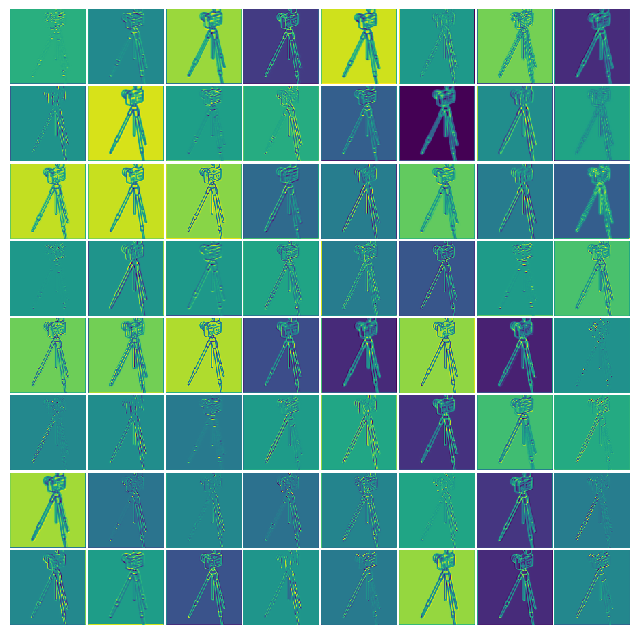

#### Layer "layer2"

Saved: img0_layer2.png


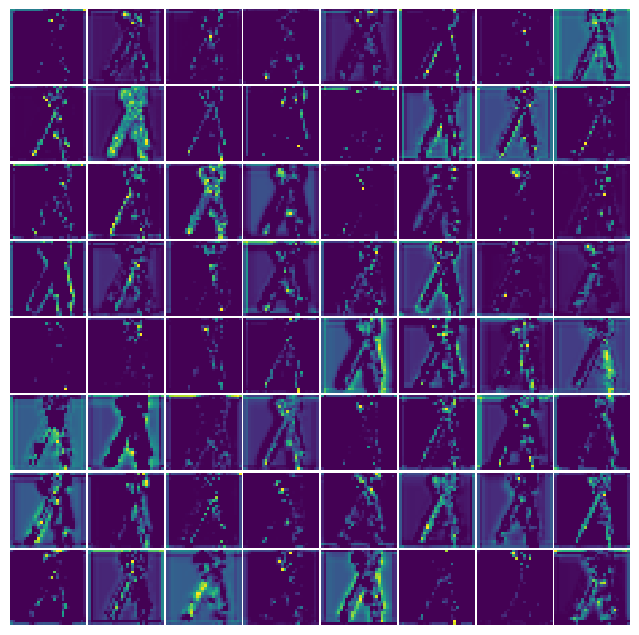

#### Layer "layer4"

Saved: img0_layer4.png


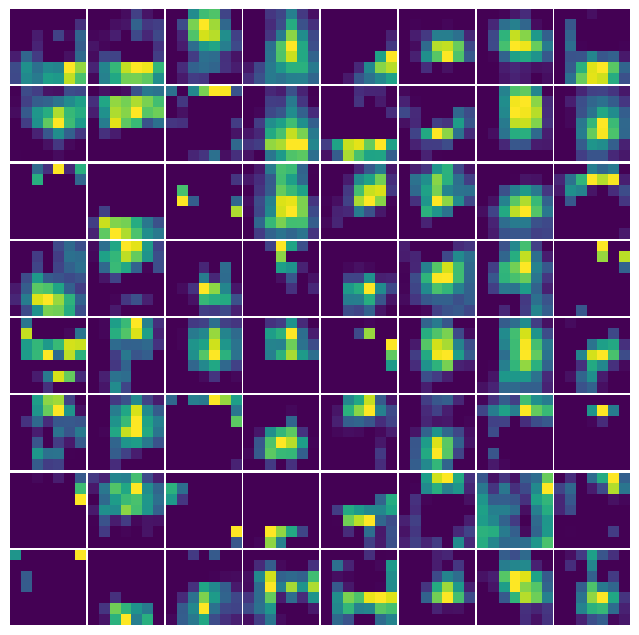

### Image No. 1

#### Layer "conv1"

Saved: img1_conv1.png


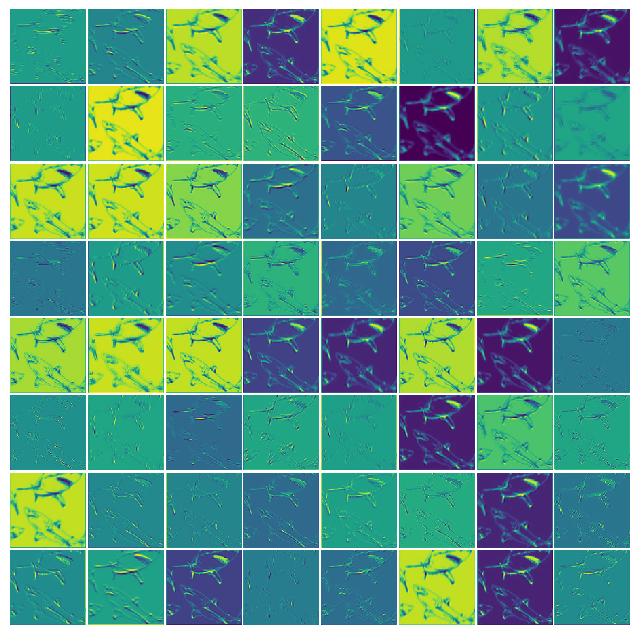

#### Layer "layer2"

Saved: img1_layer2.png


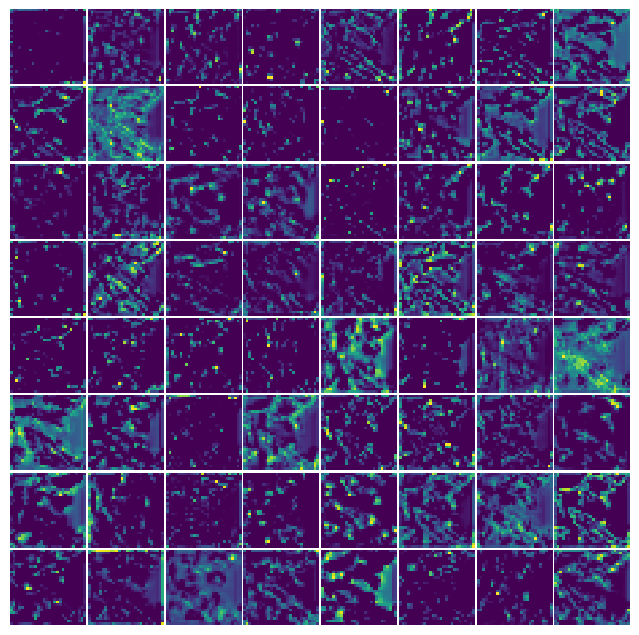

#### Layer "layer4"

Saved: img1_layer4.png


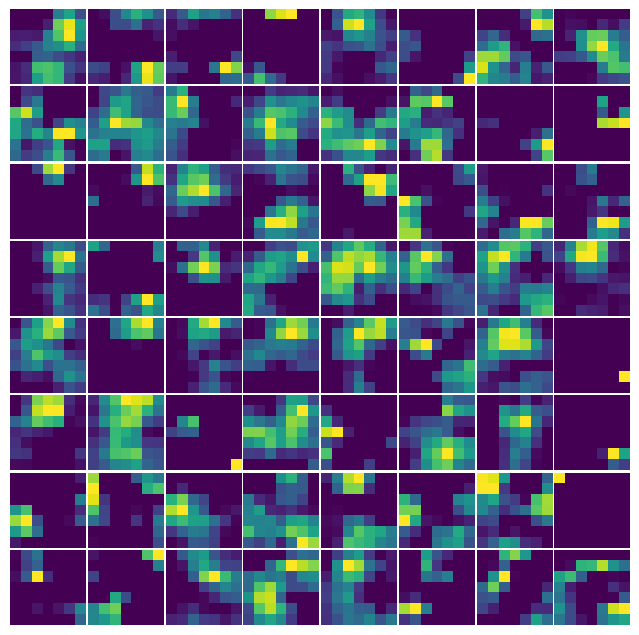

### Image No. 2

#### Layer "conv1"

Saved: img2_conv1.png


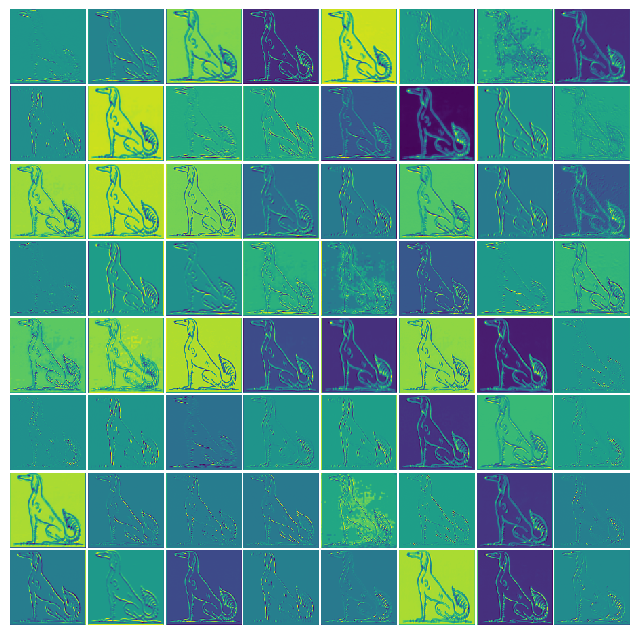

#### Layer "layer2"

Saved: img2_layer2.png


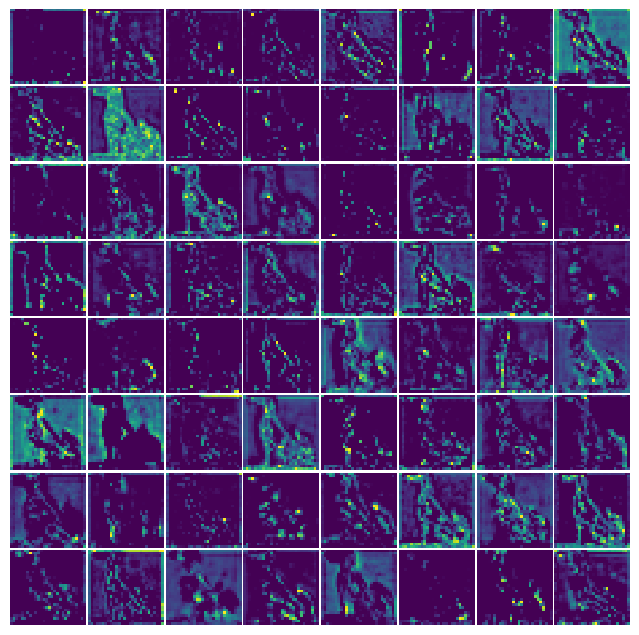

#### Layer "layer4"

Saved: img2_layer4.png


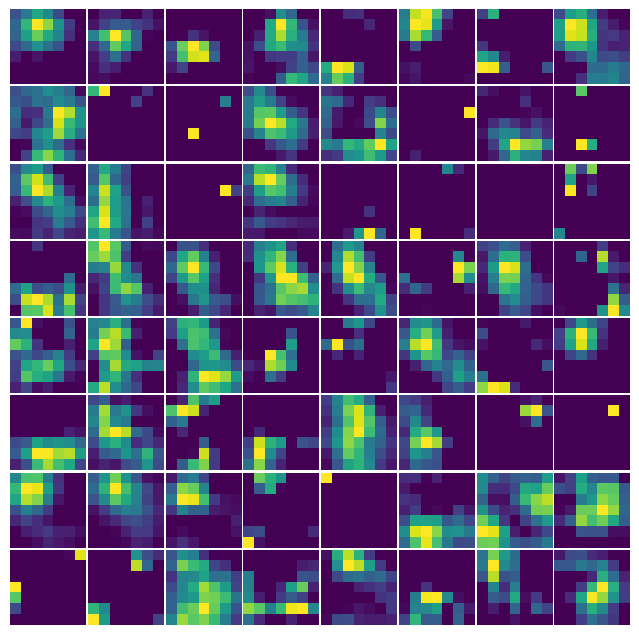

### Image No. 3

#### Layer "conv1"

Saved: img3_conv1.png


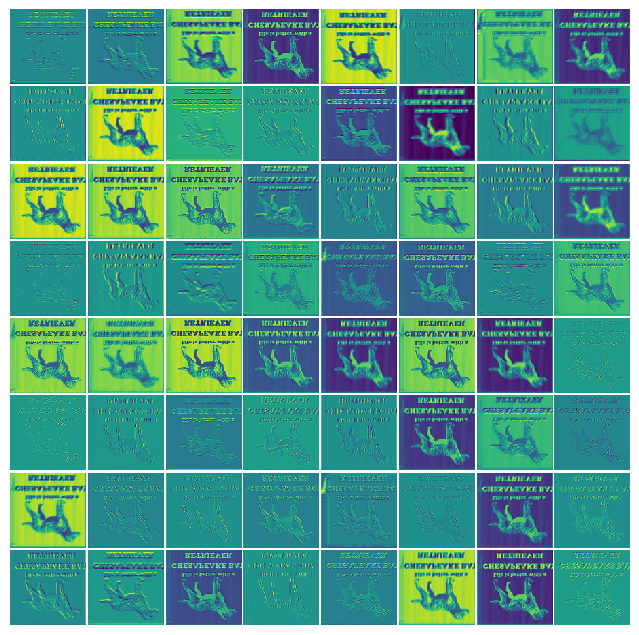

#### Layer "layer2"

Saved: img3_layer2.png


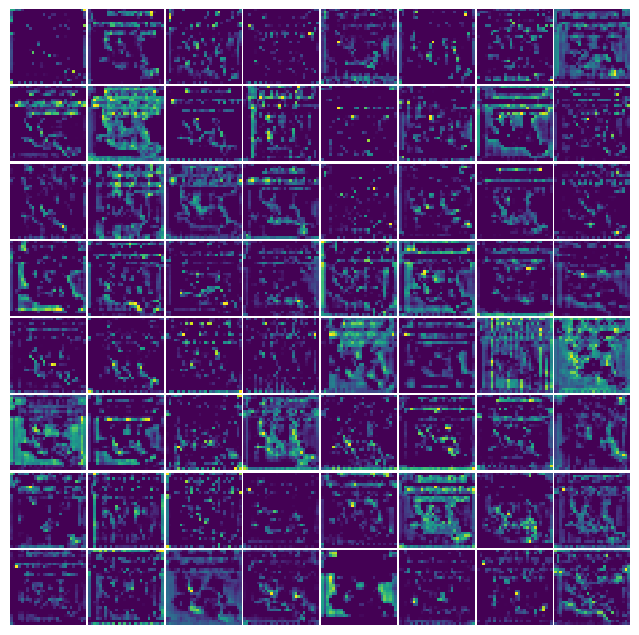

#### Layer "layer4"

Saved: img3_layer4.png


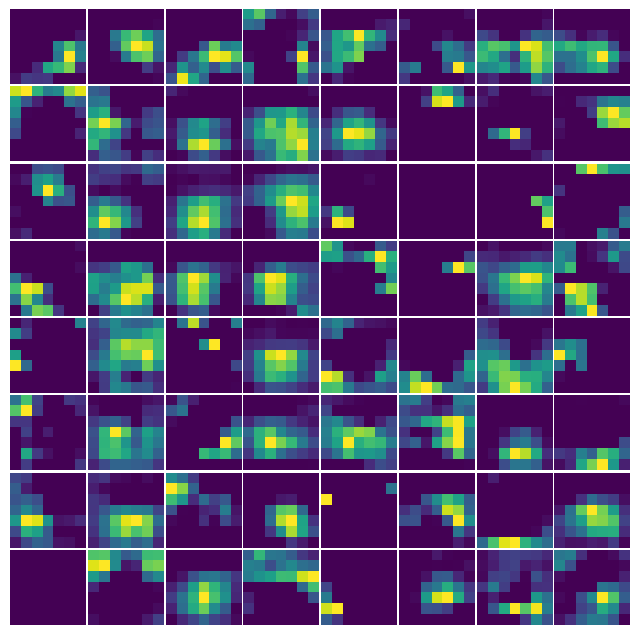

### Image No. 4

#### Layer "conv1"

Saved: img4_conv1.png


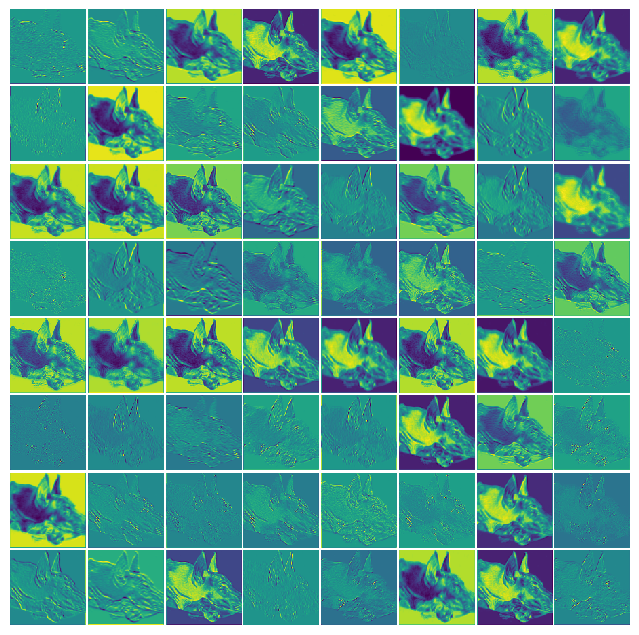

#### Layer "layer2"

Saved: img4_layer2.png


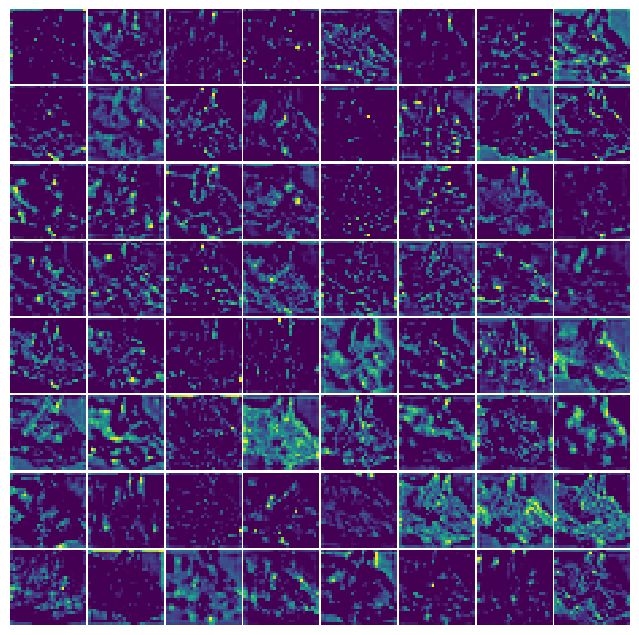

#### Layer "layer4"

Saved: img4_layer4.png


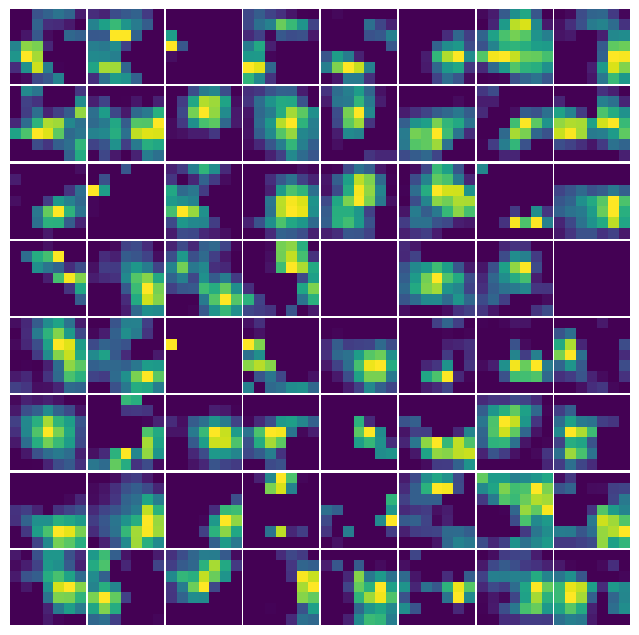

### Image No. 5

#### Layer "conv1"

Saved: img5_conv1.png


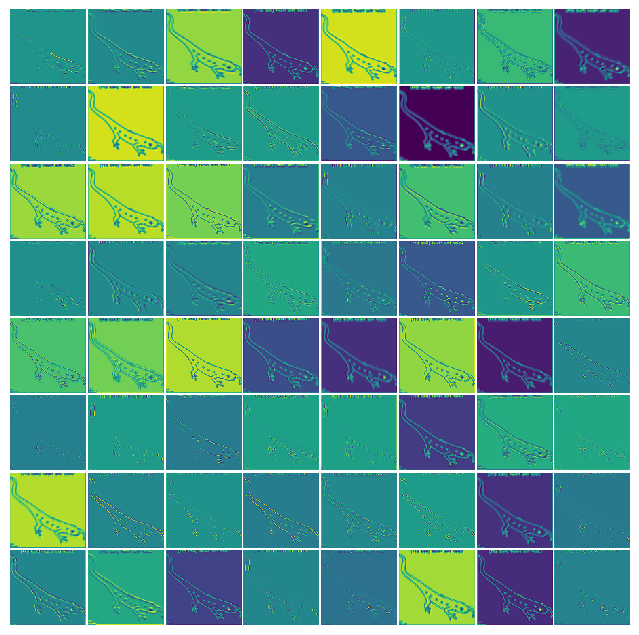

#### Layer "layer2"

Saved: img5_layer2.png


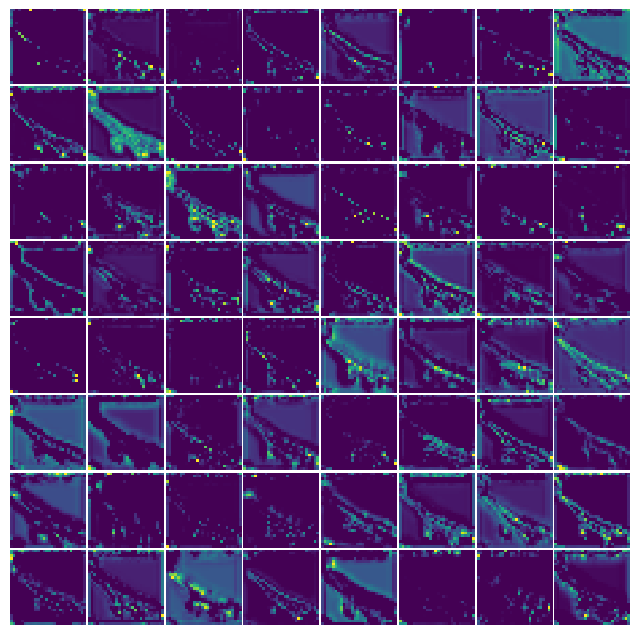

#### Layer "layer4"

Saved: img5_layer4.png


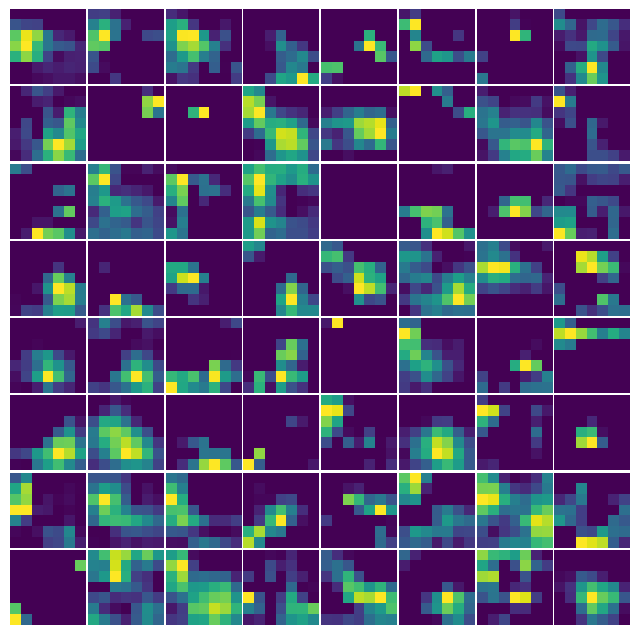

### Image No. 6

#### Layer "conv1"

Saved: img6_conv1.png


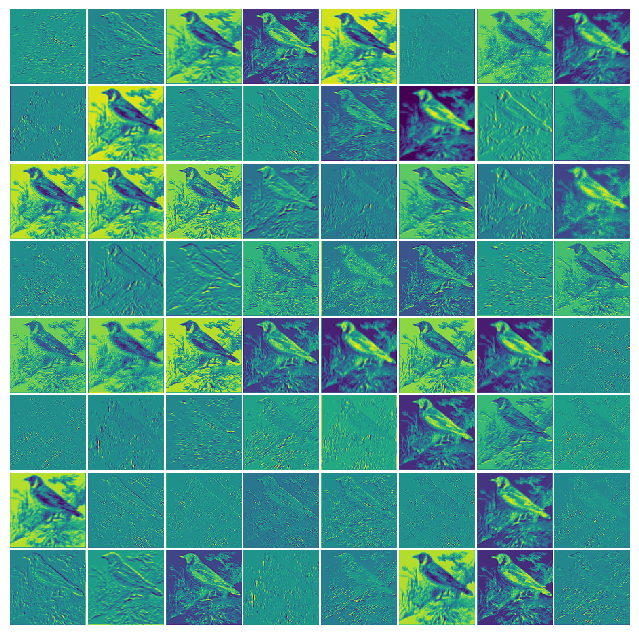

#### Layer "layer2"

Saved: img6_layer2.png


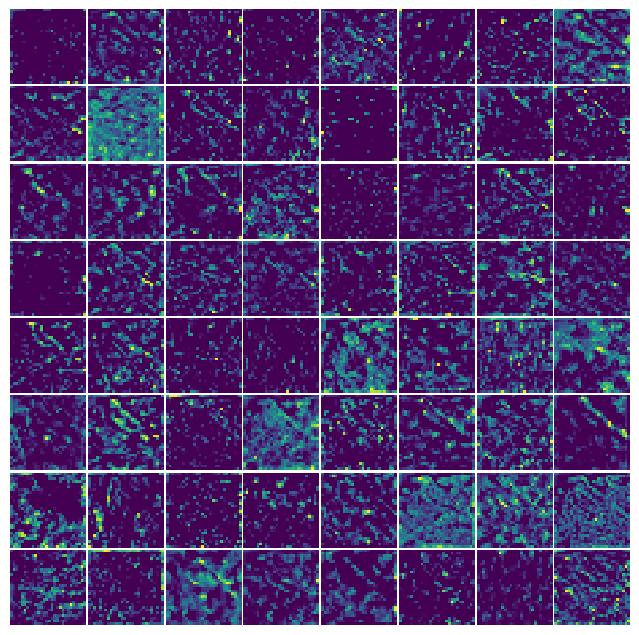

#### Layer "layer4"

Saved: img6_layer4.png


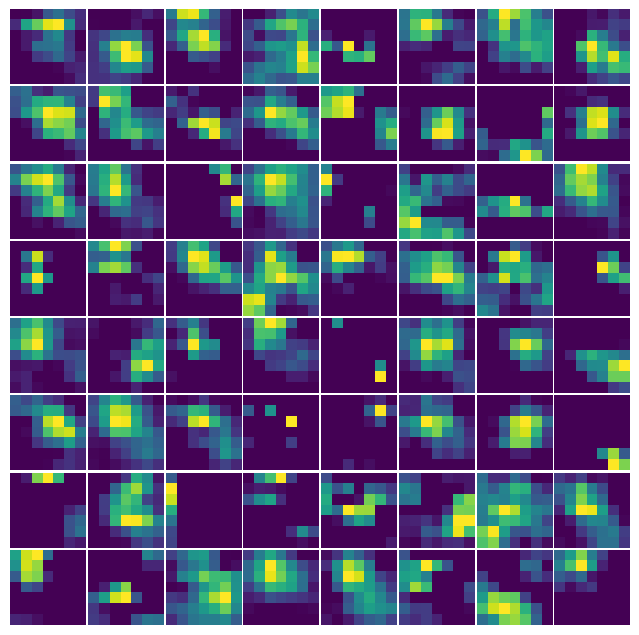

### Image No. 7

#### Layer "conv1"

Saved: img7_conv1.png


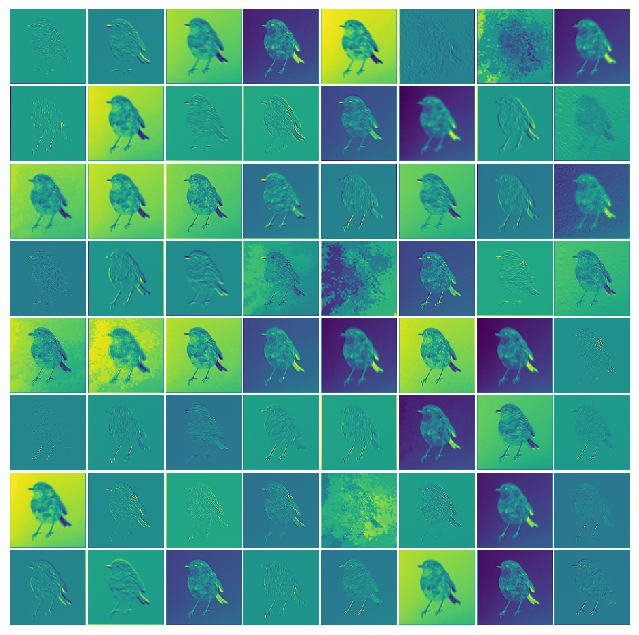

#### Layer "layer2"

Saved: img7_layer2.png


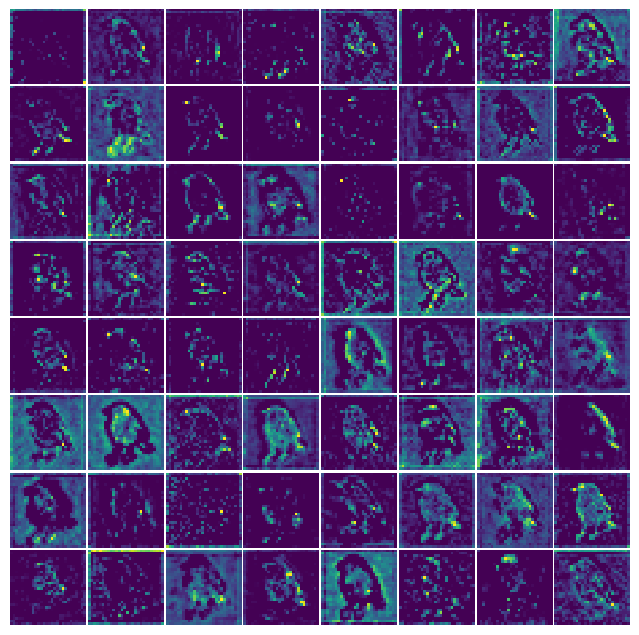

#### Layer "layer4"

Saved: img7_layer4.png


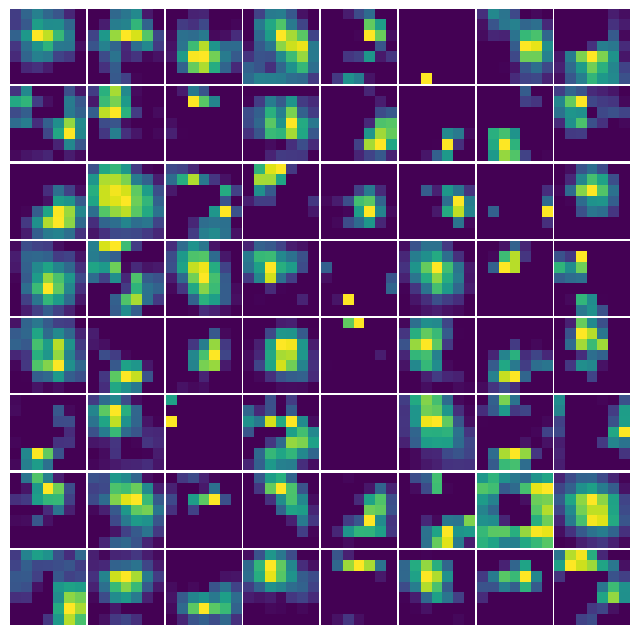

In [42]:
# Visualizing the original model
display(Markdown("## 1. Original Model"))
run_batch_visualization(resnet18_model_wo_ft, batch_samples, 'original')

#### ii. visualizing features of the fine-tuned model

## 1. Fine-tuned Model

### Image No. 0

#### Layer "conv1"

Saved: img0_conv1.png


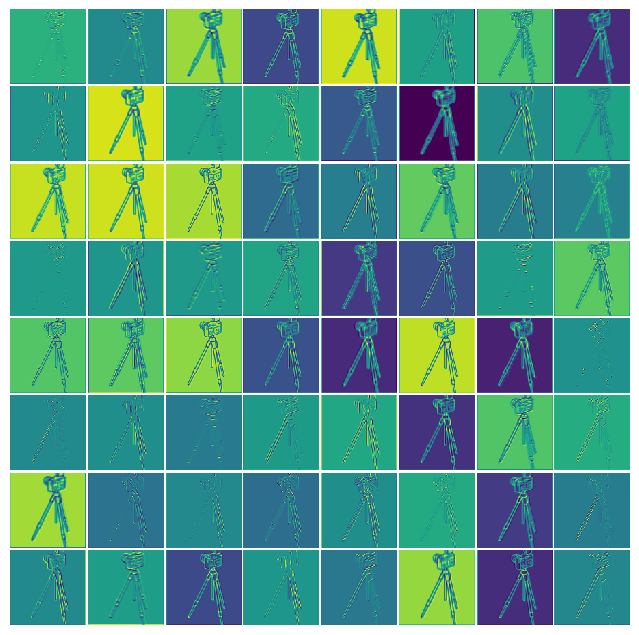

#### Layer "layer2"

Saved: img0_layer2.png


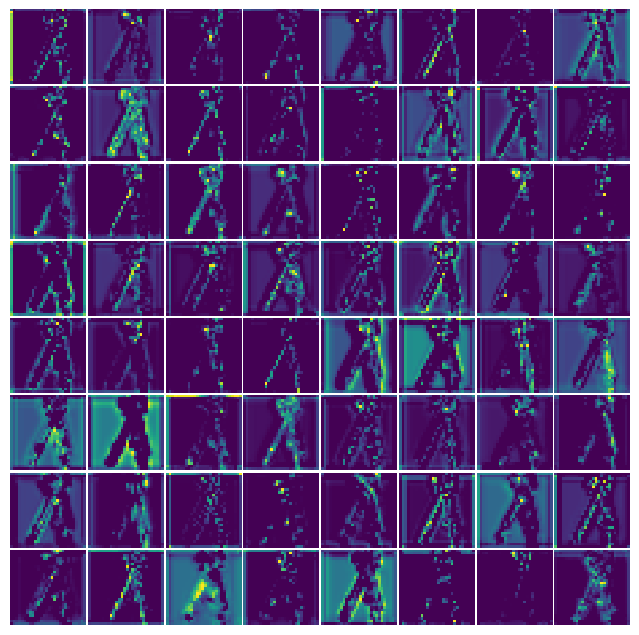

#### Layer "layer4"

Saved: img0_layer4.png


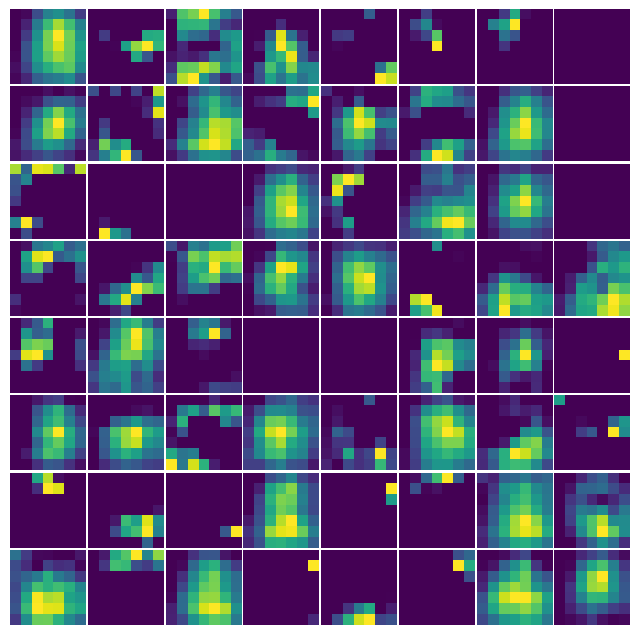

### Image No. 1

#### Layer "conv1"

Saved: img1_conv1.png


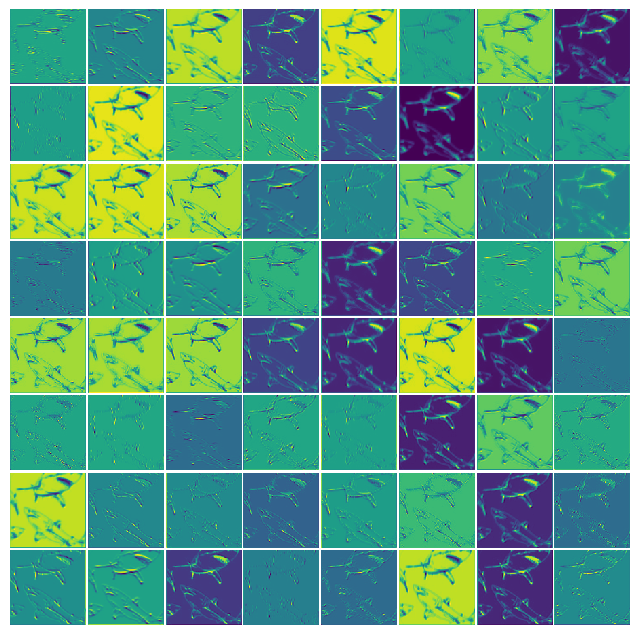

#### Layer "layer2"

Saved: img1_layer2.png


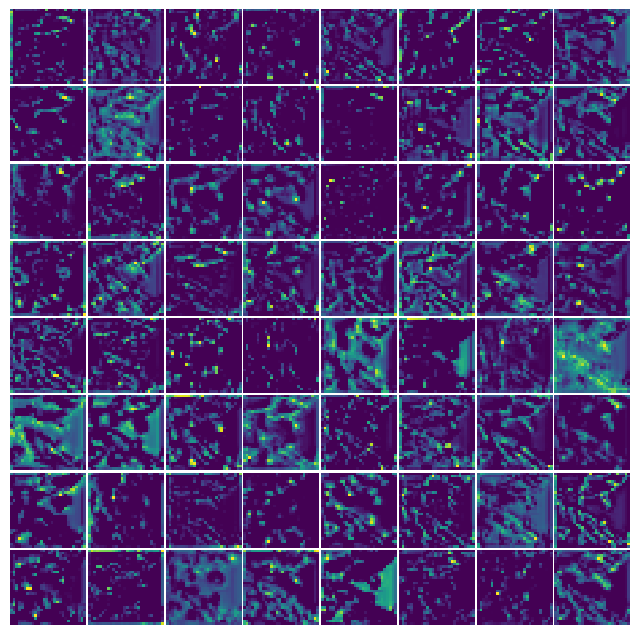

#### Layer "layer4"

Saved: img1_layer4.png


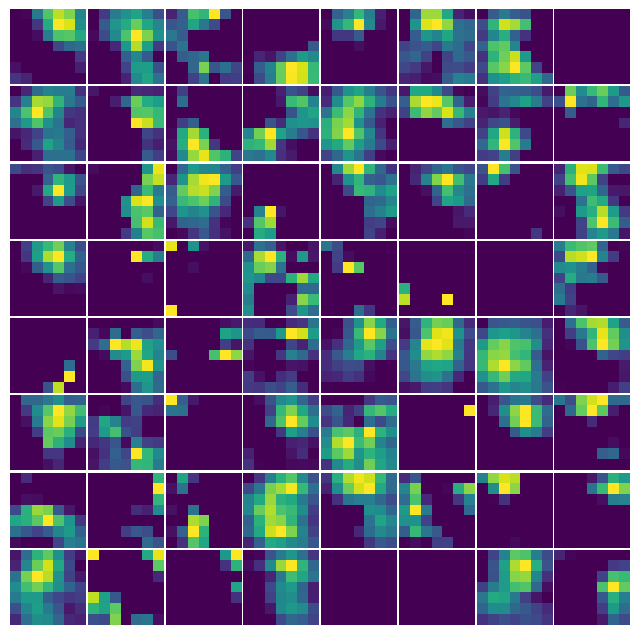

### Image No. 2

#### Layer "conv1"

Saved: img2_conv1.png


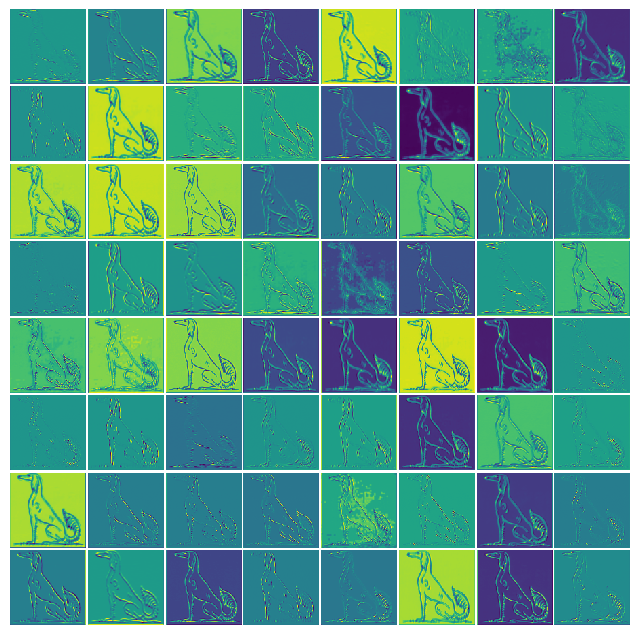

#### Layer "layer2"

Saved: img2_layer2.png


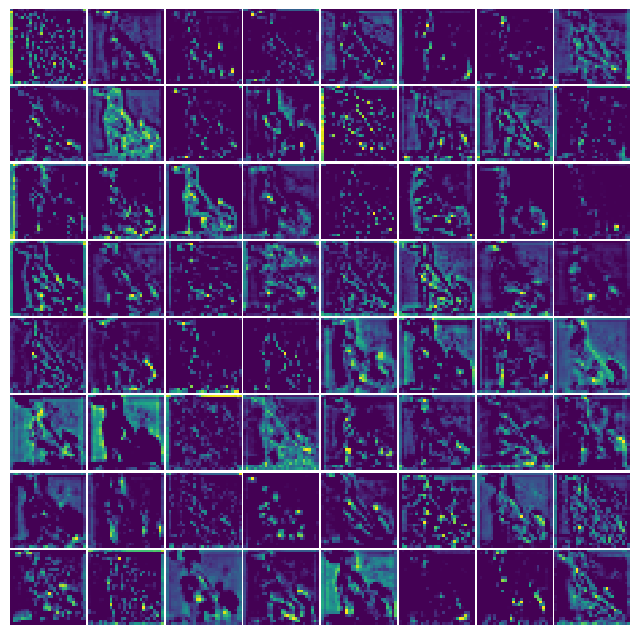

#### Layer "layer4"

Saved: img2_layer4.png


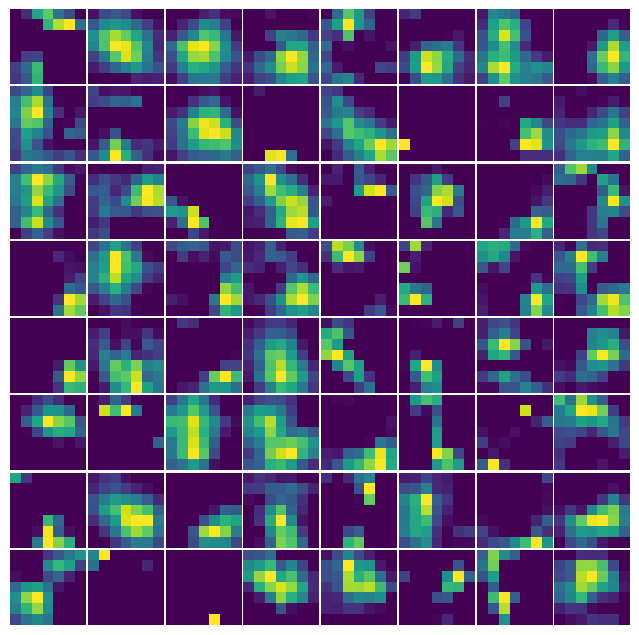

### Image No. 3

#### Layer "conv1"

Saved: img3_conv1.png


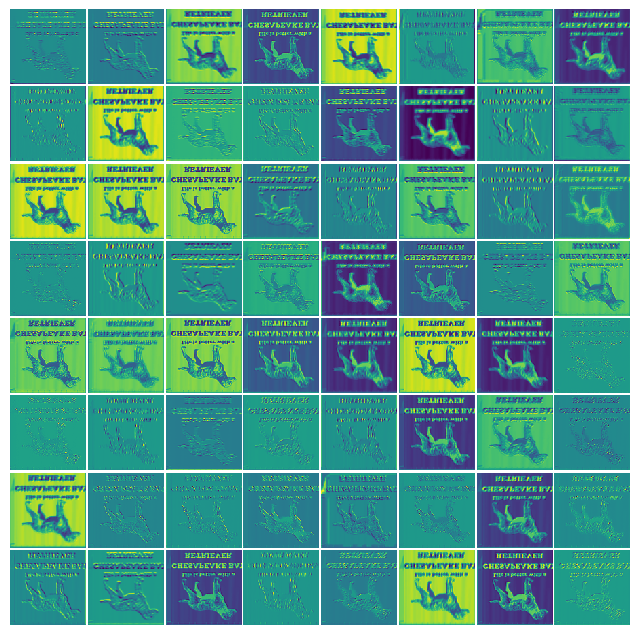

#### Layer "layer2"

Saved: img3_layer2.png


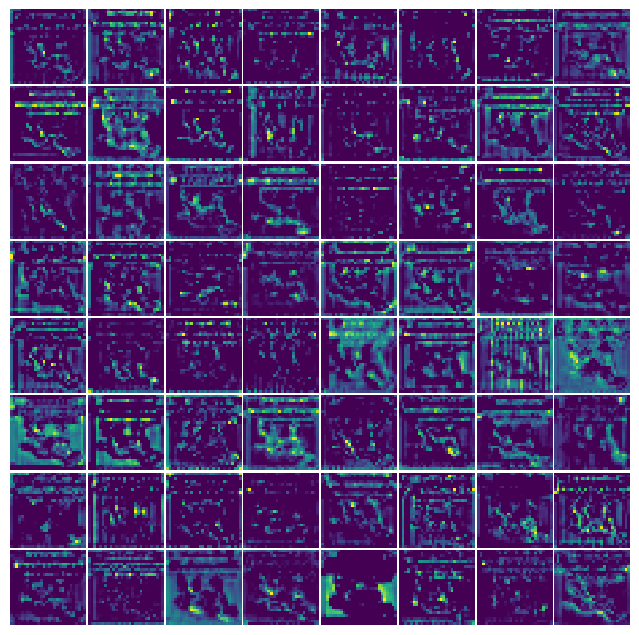

#### Layer "layer4"

Saved: img3_layer4.png


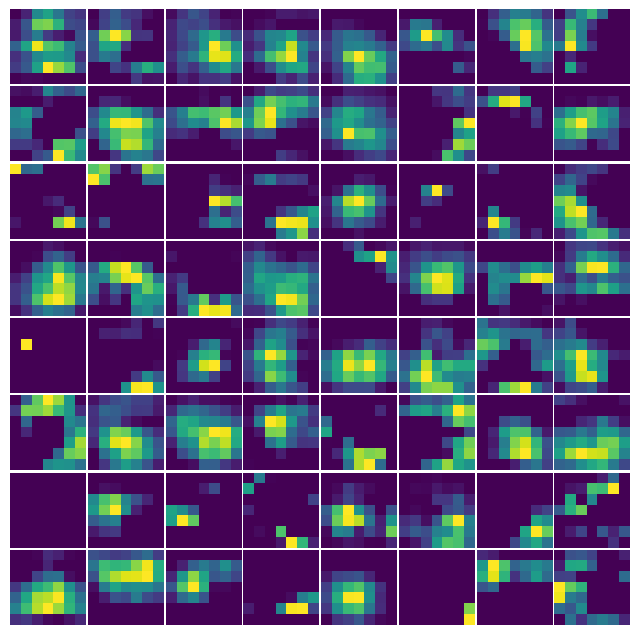

### Image No. 4

#### Layer "conv1"

Saved: img4_conv1.png


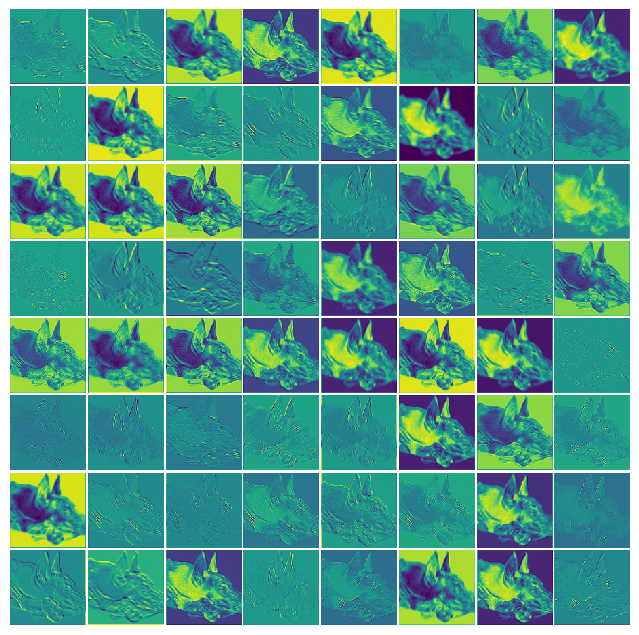

#### Layer "layer2"

Saved: img4_layer2.png


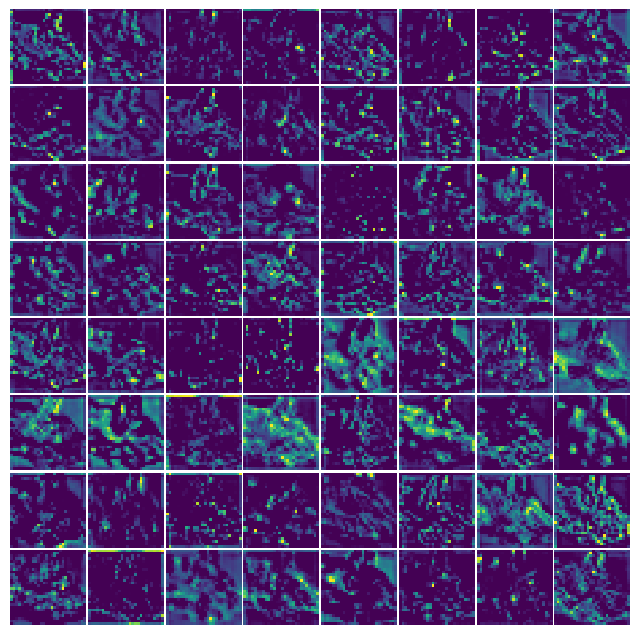

#### Layer "layer4"

Saved: img4_layer4.png


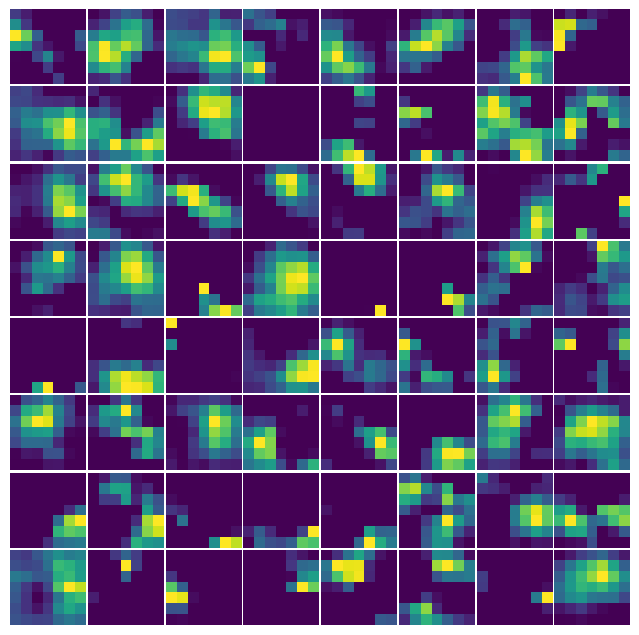

### Image No. 5

#### Layer "conv1"

Saved: img5_conv1.png


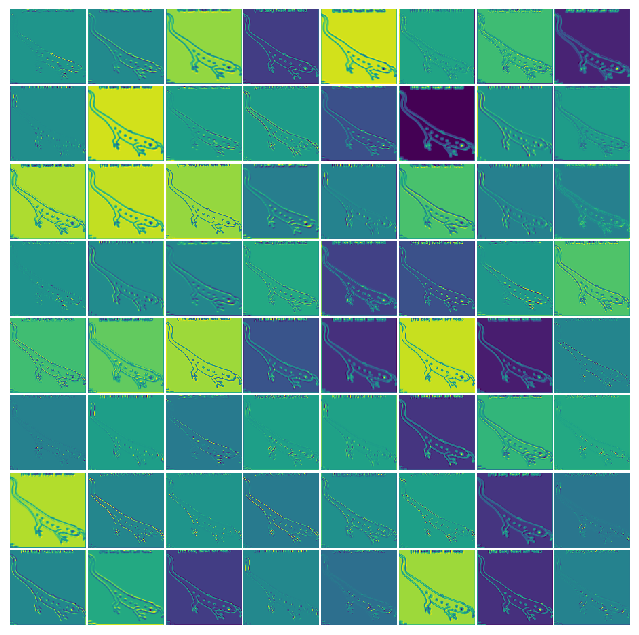

#### Layer "layer2"

Saved: img5_layer2.png


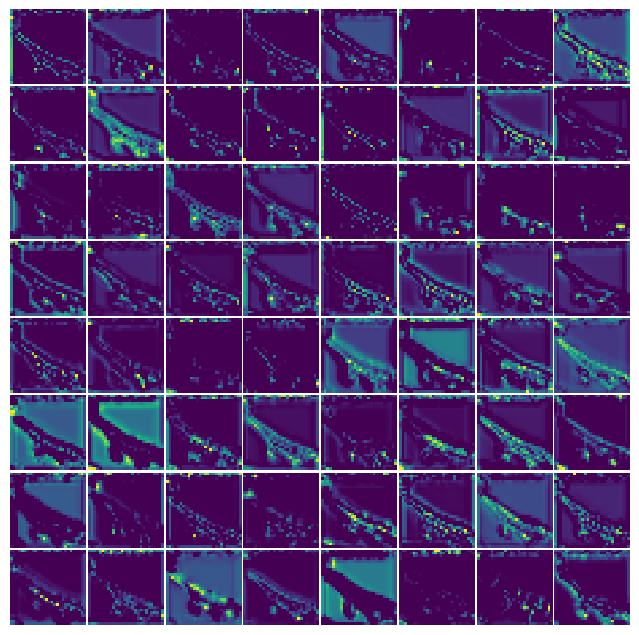

#### Layer "layer4"

Saved: img5_layer4.png


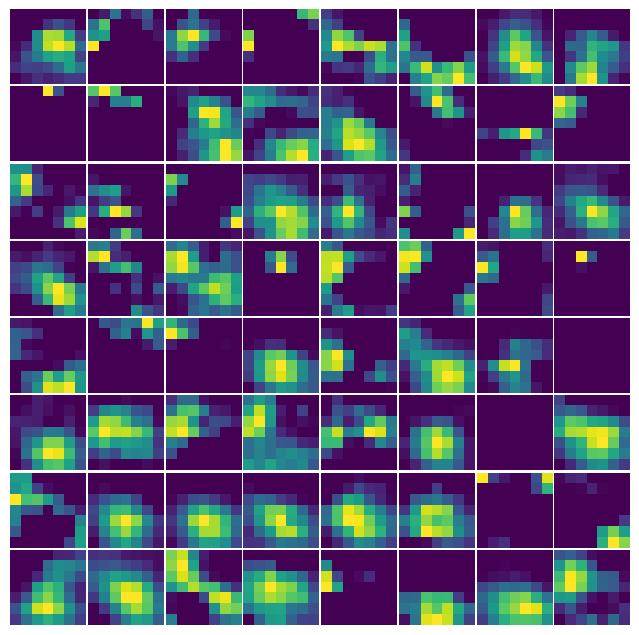

### Image No. 6

#### Layer "conv1"

Saved: img6_conv1.png


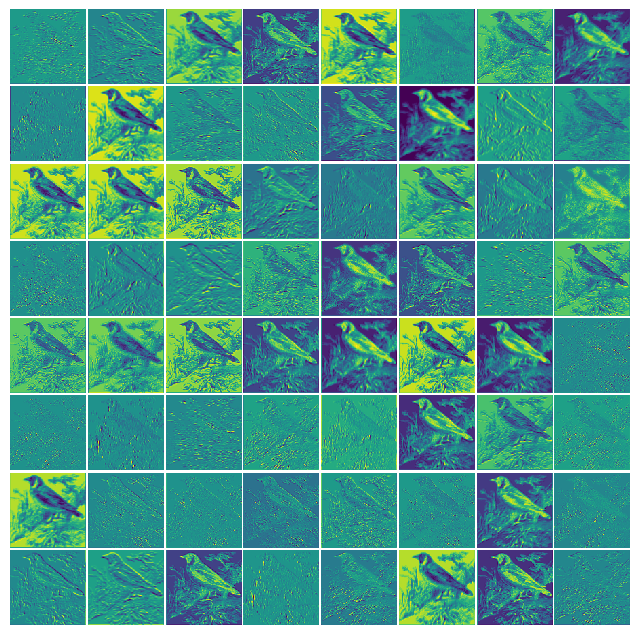

#### Layer "layer2"

Saved: img6_layer2.png


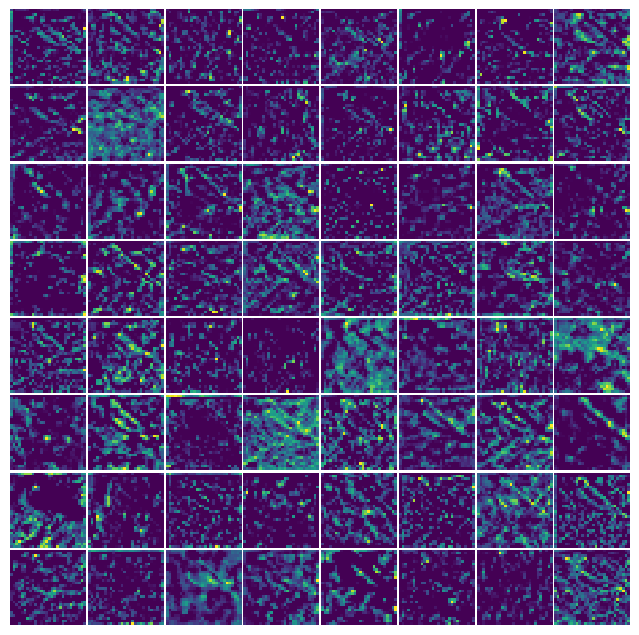

#### Layer "layer4"

Saved: img6_layer4.png


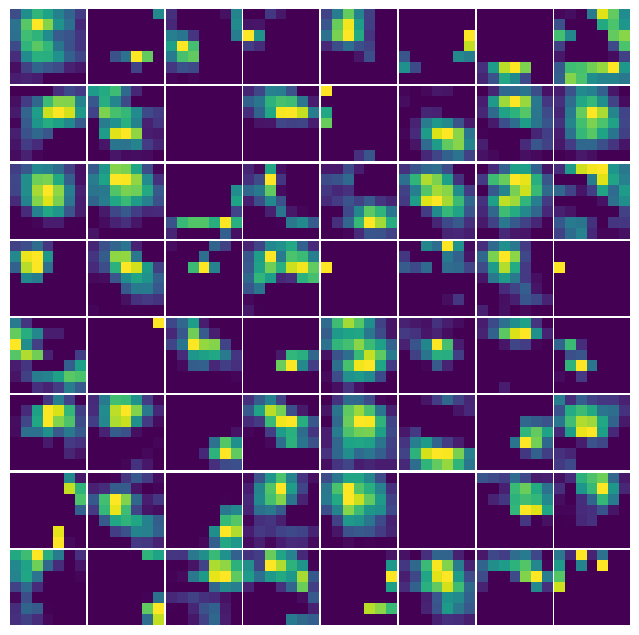

### Image No. 7

#### Layer "conv1"

Saved: img7_conv1.png


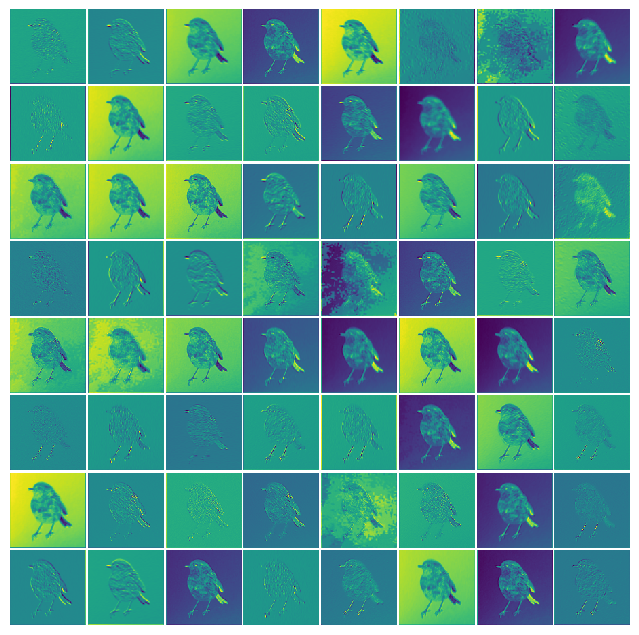

#### Layer "layer2"

Saved: img7_layer2.png


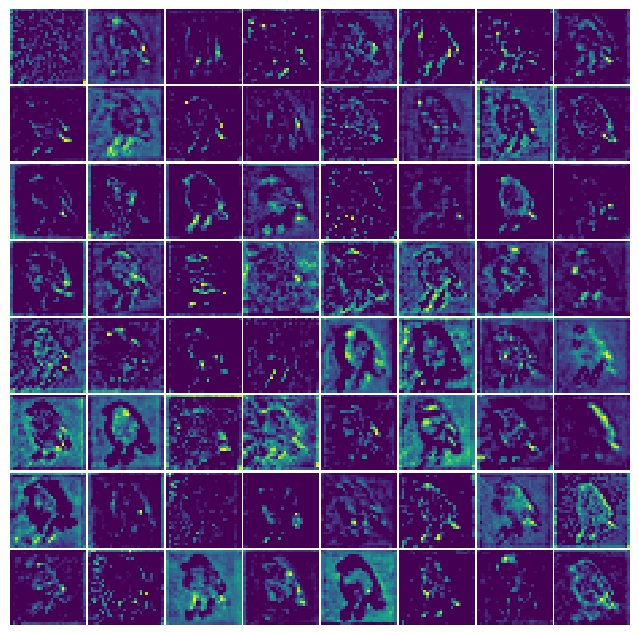

#### Layer "layer4"

Saved: img7_layer4.png


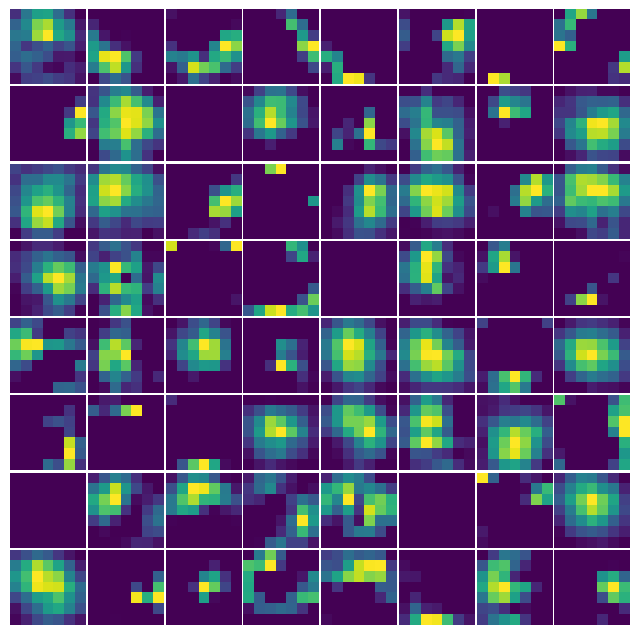

In [43]:
# Visualizing the fine tuned model
display(Markdown("## 1. Fine-tuned Model"))
run_batch_visualization(resnet_model_ft, batch_samples, 'finetuned')

### Some Visualizations:

In [ ]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

def visualize_model(model, inputs, labels=None, num_images=6):
    was_training = model.training
    model.eval()

    inputs = inputs.to(device)
    if labels is not None:
        labels = labels.to(device)

    fig = plt.figure()

    with torch.no_grad():
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        for j in range(min(inputs.size(0), num_images)):
            ax = plt.subplot(num_images // 2, 2, j + 1)
            ax.axis('off')

            if labels is not None:
                ax.set_title(f'Pred: {class_names[preds[j]]}\nTrue: {class_names[labels[j]]}')
            else:
                ax.set_title(f'Predicted: {class_names[preds[j]]}')

            imshow(inputs.cpu().data[j])

    model.train(mode=was_training)

In [50]:
inputs, labels = next(iter(dataloaders['val']))

Visualizing the finetuned model outputs:

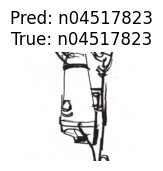

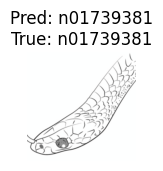

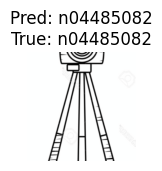

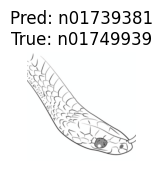

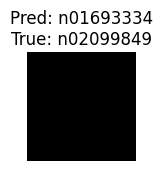

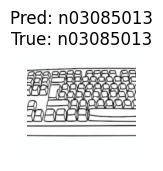

In [51]:
resnet_model_ft.to(device)
visualize_model(resnet_model_ft, inputs, labels)

Visualizing the constrained finetuned model outputs:

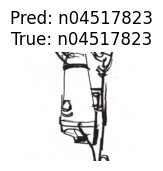

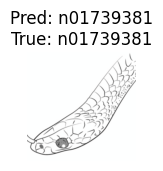

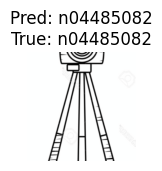

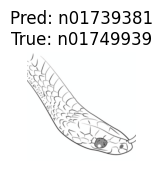

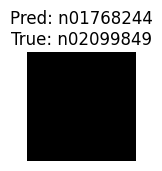

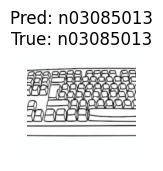

In [52]:
resnet18_qc_2b.to(device)
visualize_model(resnet18_qc_2b, inputs, labels)

Visualizing the original model outputs:

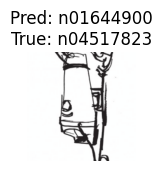

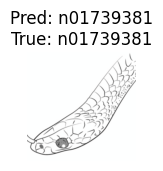

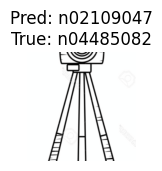

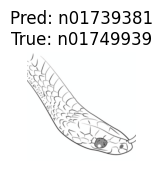

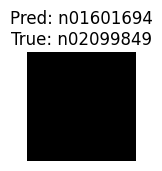

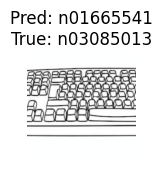

In [53]:
resnet18_model_wo_ft.to(device)
visualize_model(resnet18_model_wo_ft, inputs, labels)